# CIS 5450 Final Project - Analysis of US Traffic Accidents
Yue Wang, Raafae Zaki, Aria Xingni Shi

# Introduction

### Overview

Car accidents are the leading cause of injury and death in the United States, imposing significant public health and economic burdens, including billions in medical expenses, property damage, and lost productivity. Predicting accident severity based on factors like weather, location, and time of day can help address this issue by identifying patterns for proactive prevention and response.

This data-driven project tackles this major public safety concern by providing insights that empower policymakers, city planners, and transportation agencies to design safer infrastructure, implement evidence-based regulations, and strategically allocate emergency resources. For example, understanding how weather impacts accident severity might lead to better road maintenance strategies or advisories during hazardous conditions. Similarly, identifying high-risk locations and times of day can help optimize law enforcement presence or public awareness campaigns.

Our project demonstrates how data analysis, predictive modeling, and scientific hypothesis testing can enhance decision-making for public safety. By understanding accident causes, stakeholders can enhance readiness, reduce traffic delays, and lower the impact of car accidents on society and public safety.

<br>

### Data Description

We will be using the "US Accidents (2016 - 2023)" dataset by Moosavi et al., found on Kaggle (see Acknowledgements). This dataset is a compilation of automobile accidents nationwide covering 49 states of the USA. Data were collected from February 2016 to March 2023 using multiple APIs providing real-time traffic incident data. These APIs transmit traffic data captured by various entities including US and state transportation departments, law enforcement agencies, traffic cameras, and sensors within road networks. The dataset currently includes 500,000 accidents. This sample is extracted from the original dataset (7.7 million accident records) for easier handling and analysis.

For reference, the "Severity" column contains discrete values ranging from 1-4. where 1 indicates the least impact on traffic and safety (i.e. short delays) and 4 indicates a significant impact on traffic with potentially serious injury and loss of life.

<br>

### Acknowledgements

Acknowledgments go to the dataset creators, including Moosavi, Sobhan, Mohammad Hossein Samavatian, Srinivasan Parthasarathy, and others, for their work in compiling and creating the dataset. Their dedication and efforts have provided a valuable source of information for research and analysis of traffic accidents nationwide in the United States.

<br>

**Link:** https://www.kaggle.com/datasets/sobhanmoosavi/us-accidents/data

<br>

**Reference Papers:**

Moosavi, Sobhan, Mohammad Hossein Samavatian, Srinivasan Parthasarathy, and Rajiv Ramnath. “A Countrywide Traffic Accident Dataset.”, 2019.

Moosavi, Sobhan, Mohammad Hossein Samavatian, Srinivasan Parthasarathy, Radu Teodorescu, and Rajiv Ramnath. "Accident Risk Prediction based on Heterogeneous Sparse Data: New Dataset and Insights." In proceedings of the 27th ACM SIGSPATIAL International Conference on Advances in Geographic Information Systems, ACM, 2019.



# Configuration

This section entails importing the dataset from a CSV file using the Pandas library. The necessary libraries will be imported, and the first 5 rows of the dataset will be visualized.

## Import Packages

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
import random
import math
from xgboost import XGBClassifier
import warnings
warnings.filterwarnings('ignore')
import folium
from folium.plugins import HeatMap

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Load Dataset

In [ ]:
df = pd.read_csv('/content/drive/Shareddrives/CIS5450_Final_Project/Dataset/US_Accidents_March23_sampled_500k.csv')

Visualize first 5 rows of the dataset

In [ ]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-2047758,Source2,2,2019-06-12 10:10:56,2019-06-12 10:55:58,30.641211,-91.153481,NaN,NaN,0.000,...,False,False,False,False,True,False,Day,Day,Day,Day
1,A-4694324,Source1,2,2022-12-03 23:37:14.000000000,2022-12-04 01:56:53.000000000,38.990562,-77.399070,38.990037,-77.398282,0.056,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-5006183,Source1,2,2022-08-20 13:13:00.000000000,2022-08-20 15:22:45.000000000,34.661189,-120.492822,34.661189,-120.492442,0.022,...,False,False,False,False,True,False,Day,Day,Day,Day
3,A-4237356,Source1,2,2022-02-21 17:43:04,2022-02-21 19:43:23,43.680592,-92.993317,43.680574,-92.972223,1.054,...,False,False,False,False,False,False,Day,Day,Day,Day
4,A-6690583,Source1,2,2020-12-04 01:46:00,2020-12-04 04:13:09,35.395484,-118.985176,35.395476,-118.985995,0.046,...,False,False,False,False,False,False,Night,Night,Night,Night


In [ ]:
df.shape

(500000, 46)

# Part 1: Data Cleaning & Preparation

## Overall Information about the Data

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 46 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   ID                     500000 non-null  object 
 1   Source                 500000 non-null  object 
 2   Severity               500000 non-null  int64  
 3   Start_Time             500000 non-null  object 
 4   End_Time               500000 non-null  object 
 5   Start_Lat              500000 non-null  float64
 6   Start_Lng              500000 non-null  float64
 7   End_Lat                279623 non-null  float64
 8   End_Lng                279623 non-null  float64
 9   Distance(mi)           500000 non-null  float64
 10  Description            499999 non-null  object 
 11  Street                 499309 non-null  object 
 12  City                   499981 non-null  object 
 13  County                 500000 non-null  object 
 14  State                  500000 non-nu

**Descriptive Statistics of all the numerical columns**

In [ ]:
df.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,500000.000000,500000.000000,500000.000000,279623.000000,279623.000000,500000.000000,489534.000000,370983.000000,488870.000000,491072.000000,488709.000000,463013.000000,357384.000000
mean,2.212748,36.206421,-94.736583,36.273192,-95.776553,0.564317,61.646254,58.229028,64.834921,29.536621,9.091540,7.681347,0.008289
std,0.486661,5.071411,17.405761,5.265333,18.120211,1.774872,19.000133,22.352246,22.826158,1.008666,2.708083,5.431361,0.101865
min,1.000000,24.562117,-124.497420,24.570110,-124.497419,0.000000,-77.800000,-53.200000,1.000000,0.120000,0.000000,0.000000,0.000000
25%,2.000000,33.416823,-117.233047,33.474773,-117.778324,0.000000,49.000000,43.000000,48.000000,29.370000,10.000000,4.600000,0.000000
50%,2.000000,35.832147,-87.794365,36.192669,-88.039013,0.029000,64.000000,62.000000,67.000000,29.860000,10.000000,7.000000,0.000000
75%,2.000000,40.082443,-80.359601,40.181341,-80.252449,0.465000,76.000000,75.000000,84.000000,30.030000,10.000000,10.400000,0.000000
max,4.000000,48.999569,-67.484130,48.998901,-67.484130,193.479996,207.000000,207.000000,100.000000,38.440000,130.000000,822.800000,10.130000


## Feature types

The dataset's features needs to be converted into their appropriate types.

This will make it easier to handle the dataset, and help the models better understand the features.

In [ ]:
object_cols = df.select_dtypes(include=['object']).columns

df[object_cols] = df[object_cols].astype('category')

df["Description"] = df["Description"].astype('string')

datetime_feature_names = ["Start_Time", "End_Time", "Weather_Timestamp"]
for feature_name in datetime_feature_names:
    df[feature_name] = pd.to_datetime(df[feature_name], format='%Y-%m-%d %H:%M:%S', errors='coerce')

datetime_cols = df.select_dtypes(include=['datetime64[ns]']).columns.tolist()
cat_cols = df.select_dtypes(include=['category']).columns.tolist()
bool_cols = df.select_dtypes(include=['bool']).columns.tolist()
num_cols = df.select_dtypes(include=['float', 'int']).columns.tolist()
string_cols = df.select_dtypes(include=['string']).columns.tolist()

Data information after changing type of feature

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 46 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   ID                     500000 non-null  category      
 1   Source                 500000 non-null  category      
 2   Severity               500000 non-null  int64         
 3   Start_Time             451837 non-null  datetime64[ns]
 4   End_Time               451837 non-null  datetime64[ns]
 5   Start_Lat              500000 non-null  float64       
 6   Start_Lng              500000 non-null  float64       
 7   End_Lat                279623 non-null  float64       
 8   End_Lng                279623 non-null  float64       
 9   Distance(mi)           500000 non-null  float64       
 10  Description            499999 non-null  string        
 11  Street                 499309 non-null  category      
 12  City                   499981 non-null  cate

## Handling null values

**Heatmap Visualization for Percentage of missing values per column**

<Axes: >

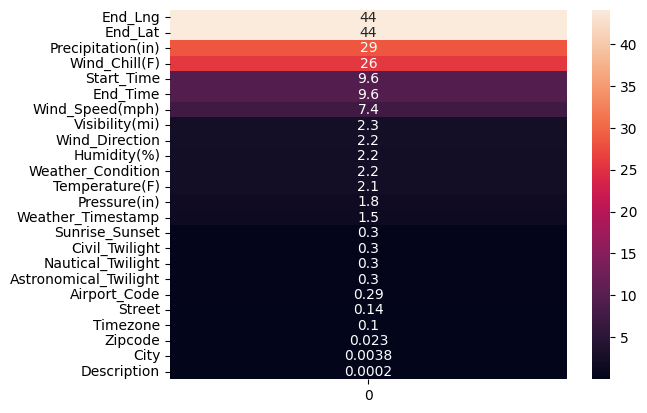

In [ ]:
# Percentage of missing values per column
missing_df = df.isna().sum().sort_values(ascending=False) / len(df)*100
percentage_miss = missing_df[missing_df != 0]
# Converting Series to Dataframe
percentage_miss = percentage_miss.to_frame()
# Heatmap Visualization
sns.heatmap(percentage_miss,annot=True)

It's a bit suspicious that some of the features have the exact same amount of null values. Perhaps they have the null values at the same rows (Work in Appendix).

Some features have more than 10% null values. This is a bit high.

Copy the dataset for additional investigation in the Appendix section

In [ ]:
df_appendix = df.copy()

**Dropping columns with more than 10% Null Percentage**

We will exclude the columns that contain more than 10% of missing values, as they are not appropriate for the analysis.

In [ ]:
cols = [var for var in df.columns if df[var].isnull().mean() > 0.1]
cols

['End_Lat', 'End_Lng', 'Wind_Chill(F)', 'Precipitation(in)']

In [ ]:
# Unnecessary columns removal
df.drop(columns=cols,inplace=True)

**Dropping rows containing Null Values for all remaining columns**

In [ ]:
df = df.dropna().reset_index(drop=True)

# Part 2: Exploratory Data Analysis

## Distribution analysis

### Numerical Features

In [ ]:
num_cols = df.select_dtypes(include=['float', 'int']).columns.tolist()

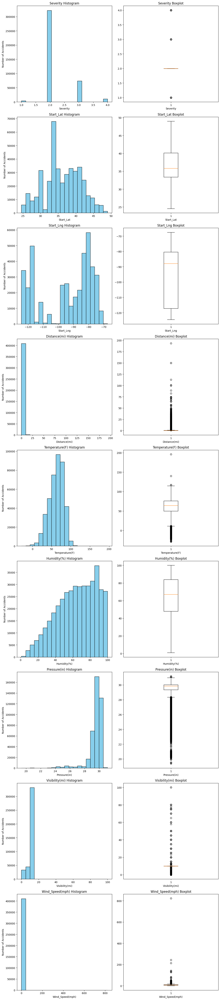

In [ ]:
def plot_numeric_features(df, numeric_features):
    df[numeric_features] = df[numeric_features].apply(pd.to_numeric, errors='coerce')
    num_cols = len(numeric_features)
    fig, axs = plt.subplots(num_cols, 2, figsize=(12, num_cols*6))

    for i, feature in enumerate(numeric_features):
        # Histogram
        axs[i, 0].hist(df[feature], bins=20, color='skyblue', edgecolor='black')
        axs[i, 0].set_title(f'{feature} Histogram')
        axs[i, 0].set_xlabel(feature)
        axs[i, 0].set_ylabel('Number of Accidents')

        # Boxplot
        axs[i, 1].boxplot(df[feature], vert=True)
        axs[i, 1].set_title(f'{feature} Boxplot')
        axs[i, 1].set_xlabel(feature)

    plt.tight_layout()
    plt.show()
plot_numeric_features(df, num_cols)

An analysis of the distributions shown in the histograms and boxplots for each feature.

**Severity**
- The distribution is highly skewed towards value 2.0, showing the highest frequency
- There are three main severity levels observed: 2.0, 3.0, and 4.0
- The boxplot shows several outlier
- The median severity appears to be around 2.0

**Start Latitude and Longitude**
- Start latitude shows a roughly normal distribution centered around 35-40 degrees
- The longitude distribution appears multimodal with several peaks
- Both distributions show reasonable spread in the boxplots with few outliers

**Distance**
- Most incidents occurring at short distances
- The vast majority of distances are concentrated near 0
- The boxplot reveals numerous outliers extending up to 200 units
- The median distance is very close to zero

**Temperature**
- Approximately normal distribution centered around 50-75°F
- The boxplot shows: More outliers on the lower temperature end (around 20-30°F)


**Humidity**
- Shows an increasing trend from 0% to 100%
- Right-skewed distribution with peak near 80-90%

**Pressure**
- Extremely concentrated distribution around 30 units
- Multiple outliers extending below the lower whisker

**Visibility**
- High frequency at the lowest visibility range(0-15 mile)
- Multiple outliers appear above the box, extending up to about 100 miles

**Wind_Speed**
- A dominant peak near 0 mph with approximately 400,000 observations
- Numerous outliers extending upward



**Get target variable's numeric distribution**

In [ ]:
df["Severity"].value_counts()  / len(df["Severity"])

,count
Severity,
2,0.784626
3,0.180191
4,0.025162
1,0.010021


Almost 78% of data's severity is 2!

###Boolean Features

In [ ]:
bool_cols = df.select_dtypes(include=['bool']).columns.tolist()

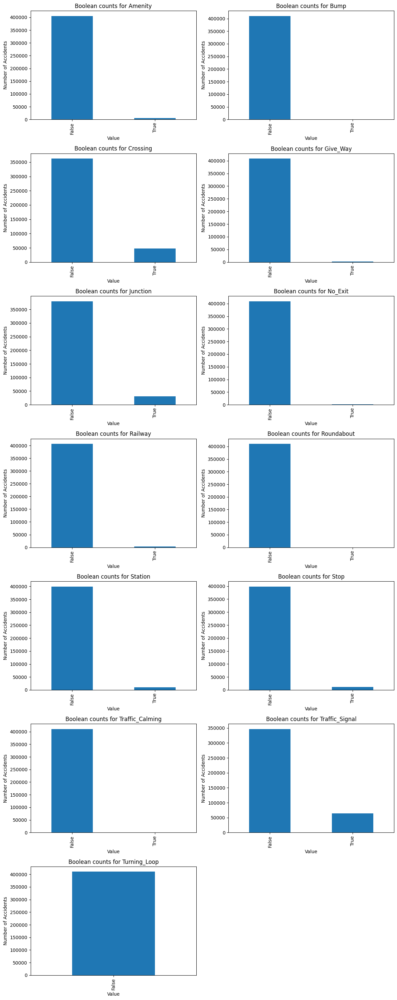

In [ ]:
def plot_boolean_features(df, bool_features):
    # Calculate the number of rows and columns for subplots
    num_features = len(bool_features)
    num_rows = num_features // 2 + num_features % 2
    num_cols = 2

    # Create subplots with rectangular shape
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 30))

    # Flatten the axes array to make it easier to iterate
    axes = axes.flatten()

    # Plot boolean counts for specified features
    for i, feature in enumerate(bool_features):
        counts = df[feature].value_counts()
        counts.plot(kind='bar', ax=axes[i])
        axes[i].set_title(f'Boolean counts for {feature}')
        axes[i].set_xlabel('Value')
        axes[i].set_ylabel('Number of Accidents')
    # Hide empty subplots
    for j in range(num_features, num_rows * num_cols):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
plot_boolean_features(df, bool_cols)

In all these cases, the false values is in a lot more instances than the true value.


### Categorical Features

In [ ]:
cat_cols = df.select_dtypes(include=['category']).columns.tolist()

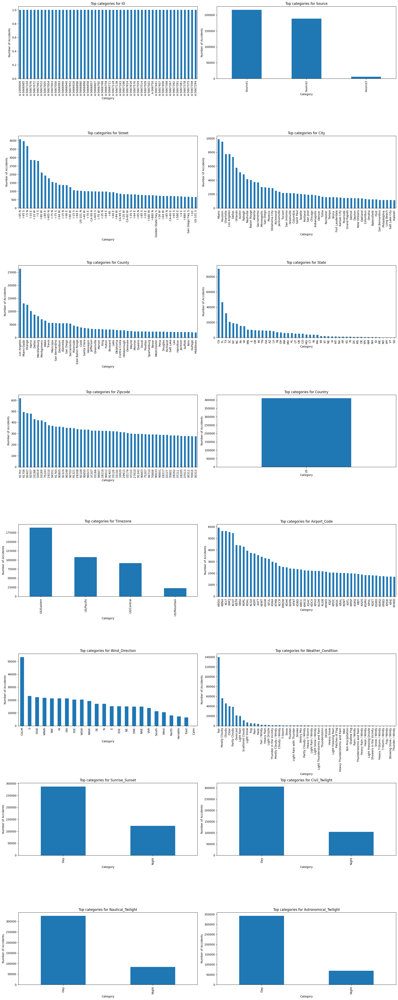

In [ ]:
def plot_top_categories(df, cat_features):
    # Calculate the number of rows and columns for subplots
    num_features = len(df[cat_features].columns)
    num_rows = num_features // 2 + num_features % 2
    num_cols = 2

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 50))

    # Flatten the axes array to make it easier to iterate
    axes = axes.flatten()

    # Plot top categories for each categorical feature
    for i, column in enumerate(df[cat_features].columns):
        top_categories = df[column].value_counts().nlargest(50)
        top_categories.plot(kind='bar', ax=axes[i])
        axes[i].set_title(f'Top categories for {column}')
        axes[i].set_xlabel('Category')
        axes[i].set_ylabel('Number of Accidents')

    # Hide empty subplots
    for j in range(num_features, num_rows * num_cols):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
plot_top_categories(df, cat_cols)

ID feature can be cut out. It only has unique values.

Tne same goes for Country. Every instance is from the US.

Weather_Condition has a lot of categories.

This is because the weather types can be of different strenghts (a lot of rain, and just a bit of rain). It also comes several wather types for some values (Ex "Mostly Cloudy / Windy"). This results in a lot of categories being little used.

## Interested Column analysis

### Start_Time

Shows start time of the accident in local time zone.

**Create histograms for hours, years, and days of the week**

In [ ]:
year = df['Start_Time'].dt.year
month = df['Start_Time'].dt.month
dayofweek = df['Start_Time'].dt.dayofweek
hour = df['Start_Time'].dt.hour
weekday_hour = df[df['Start_Time'].dt.dayofweek < 5]['Start_Time'].dt.hour
weekend_hour = df[df['Start_Time'].dt.dayofweek >= 5]['Start_Time'].dt.hour

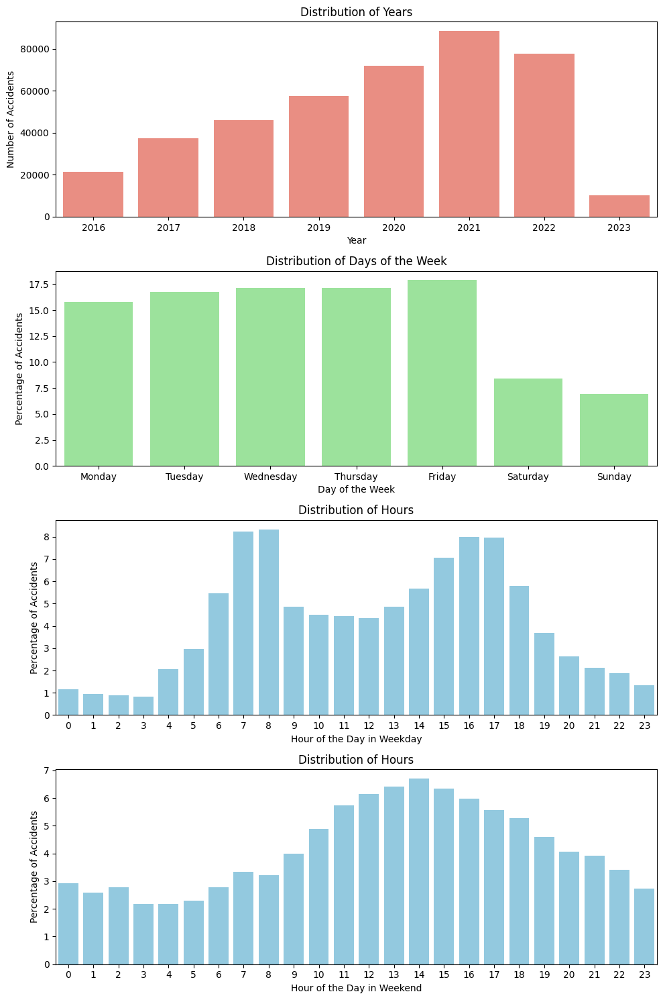

In [ ]:
# Create histograms for hours, years, and days of the week
fig, axes = plt.subplots(4, 1, figsize=(10, 15))

# Histogram for years
year_frequency = (year.value_counts()).sort_index()
sns.barplot(x=year_frequency.index.astype(int), y=year_frequency.values, ax=axes[0], color='salmon')
axes[0].set_title('Distribution of Years')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Number of Accidents')

# Histogram for days of the week
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_percentage = (dayofweek.value_counts(normalize=True) * 100).sort_index()
sns.barplot(x=day_percentage.index, y=day_percentage.values, ax=axes[1], color='lightgreen')
axes[1].set_title('Distribution of Days of the Week')
axes[1].set_xlabel('Day of the Week')
axes[1].set_ylabel('Percentage of Accidents')
axes[1].set_xticks(range(7))
axes[1].set_xticklabels(days)


# Histogram for Hours in Weekdays
hour_percentage = (weekday_hour.value_counts(normalize=True) * 100).sort_index()
sns.barplot(x=hour_percentage.index.astype(int), y=hour_percentage.values, ax=axes[2], color='skyblue')
axes[2].set_title('Distribution of Hours')
axes[2].set_xlabel('Hour of the Day in Weekday')
axes[2].set_ylabel('Percentage of Accidents')

# Histogram for Hours in Weekends
hour_percentage = (weekend_hour.value_counts(normalize=True) * 100).sort_index()
sns.barplot(x=hour_percentage.index.astype(int), y=hour_percentage.values, ax=axes[3], color='skyblue')
axes[3].set_title('Distribution of Hours')
axes[3].set_xlabel('Hour of the Day in Weekend')
axes[3].set_ylabel('Percentage of Accidents')
plt.tight_layout()
plt.show()

**Accident frequency for each year**
- We see that the most accidents in one year occurred in 2021.

**Accident distribution for day of week**
- The histogram indicates that significantly more accidents occur from Monday to Friday compared to Saturday and Sunday.

**Accident distribution for hour of weekday**
- The majority of accidents happen during the morning peak hours (7-8 AM) and the afternoon peak hours (4-5 PM). This makes sense since these are the hours where most people are commuting to and from work, resulting in high traffic congestion on main roads and highways.

**Accident distribution for hour in weekend**
- The majority of accidents happen during the afternon peak hours (1-2 PM)

Considering why 2023 has less accidents

In [ ]:
earliest_date = df["Start_Time"].min()
latest_date = df['Start_Time'].max()

print("Earliest Date:", earliest_date)
print("Latest Date:", latest_date)

Earliest Date: 2016-01-14 20:18:33
Latest Date: 2023-03-31 22:46:13


The data for 2016 only includes about 3 months worth of data instead of a full year. But still not far enough that there should be substantially less observations for us to use in our analyses.

The dataset also ends in early 2023, which explains why 2023 has less accident data.

### End_Time

Shows end time of the accident in local time zone.

Combine Start_Time together to check if duration affect accident severity

**Accident Duration by Severity:**

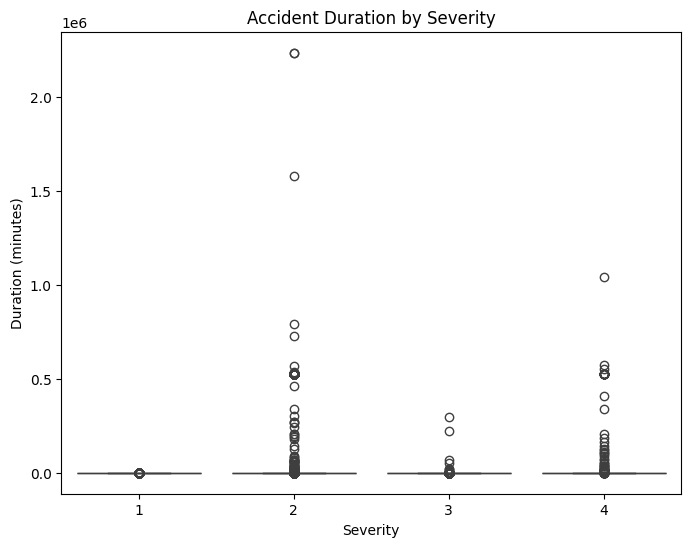

In [ ]:
# Calculate duration in minutes
df['duration'] = (df['End_Time'] - df['Start_Time']).dt.total_seconds() / 60

# Boxplot of accident duration by severity
plt.figure(figsize=(8, 6))
sns.boxplot(x='Severity', y='duration', data=df)
plt.xlabel('Severity')
plt.ylabel('Duration (minutes)')
plt.title('Accident Duration by Severity')
plt.show()

It looks like the accident duration is heavily skewed by a few extreme outliers that are stretching the y-axis. Most of the durations seem to be clustered near the lower values, which makes it difficult to see meaningful patterns.


**Accident Duration by Severity (Log Scale):**

The log scale allows us to examine a wide range of durations while also making the plot clearer. It highlights differences in the order of magnitude of the durations across severities.


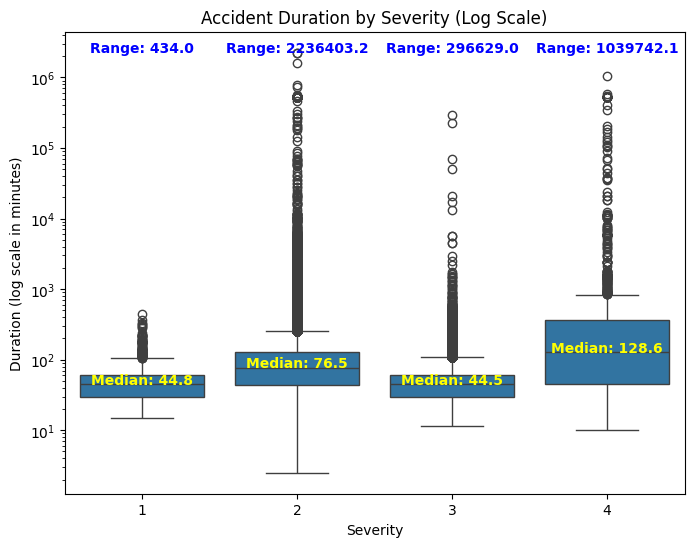

In [ ]:
plt.figure(figsize=(8, 6))

# Create the boxplot
ax = sns.boxplot(x='Severity', y='duration', data=df)
plt.yscale('log')

# Calculate medians and ranges for each severity
medians = df.groupby(['Severity'])['duration'].median().values
ranges = df.groupby(['Severity'])['duration'].agg(lambda x: np.ptp(x)).values  # ptp calculates range (max - min)

# Add annotations for median and range
for i, median in enumerate(medians):
    ax.text(i, median, f'Median: {median:.1f}', horizontalalignment='center', color='yellow', weight='semibold')

# Optionally add range info
for i, r in enumerate(ranges):
    ax.text(i, max(df['duration']), f'Range: {r:.1f}', horizontalalignment='center', color='blue', weight='semibold')

plt.xlabel('Severity')
plt.ylabel('Duration (log scale in minutes)')
plt.title('Accident Duration by Severity (Log Scale)')

plt.show()

Key Observations:

* Severity 1:
  * Median Duration: 44.8 minutes
  * Range: 434 minutes
  * Interpretation: The median duration is the lowest among all severity levels(except Severity 3), which makes sense as less severe accidents generally take less time to clear. The range is quite small (434 minutes), indicating that most accidents in this category are resolved relatively quickly and with less variability.
* Severity 2:
	* Median Duration: 76.5 minutes
	* Range: 2,236,403.2 minutes (approximately 4.25 years!)
	* Interpretation: While the median duration is moderately higher compared to Severity 1, the range is exceptionally large. This extreme range might suggest that there are a few very long-lasting accidents or outliers skewing the data.
* Severity 3:
	*	Median Duration: 44.5 minutes
	*	Range: 296,629 minutes (~206 days)
	*	Interpretation: The median duration is nearly the same as Severity 1, which is surprising because one would expect more severe accidents to take longer to resolve. However, the range is much larger, suggesting there are some extreme outliers in this category.
* Severity 4:
	*	Median Duration: 128.6 minutes
	*	Range: 1,039,742.1 minutes (~1.98 years)
	*	Interpretation: This category has the highest median duration, which aligns with expectations as the most severe accidents generally take more time to resolve. The large range indicates a lot of variability, likely due to the fact that severe accidents can require long recovery times, road repairs, or complex investigations.



**Visualize Outliers**







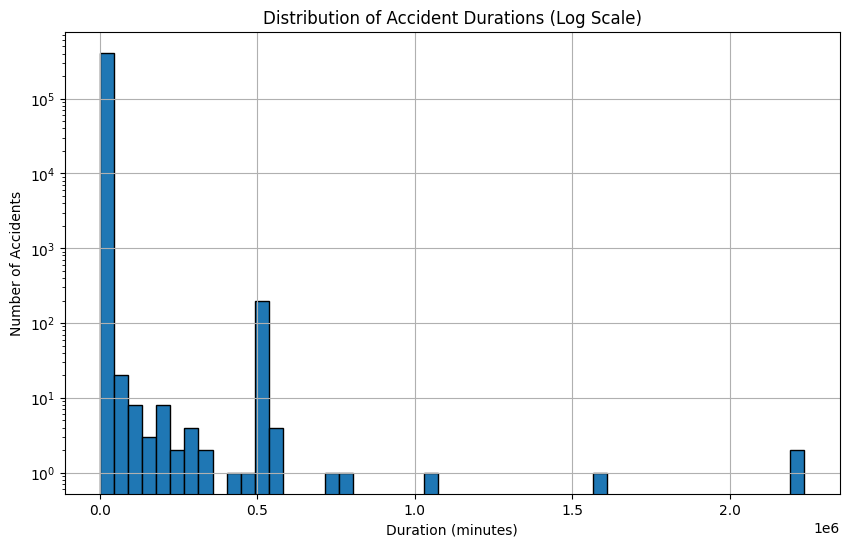

In [ ]:
# Histogram to check the distribution
plt.figure(figsize=(10, 6))
df['duration'].hist(bins=50, edgecolor='black', log=True)
plt.xlabel('Duration (minutes)')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accident Durations (Log Scale)')
plt.show()

**Remove outliers**

In [ ]:
# Define a function to remove outliers using the IQR method
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)  # First quartile (25th percentile)
    Q3 = df[column].quantile(0.75)  # Third quartile (75th percentile)
    IQR = Q3 - Q1  # Interquartile range

    # Define the bounds for non-outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter out the outliers
    df_filtered = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df_filtered

# Apply the function to the 'duration' column
df_clean = remove_outliers(df, 'duration')

print(f"Original dataset size: {df.shape[0]}")
print(f"Dataset size after removing outliers: {df_clean.shape[0]}")

Original dataset size: 410421
Dataset size after removing outliers: 371851


**Accident Duration by Severity (Log Scale) -- Post-Outlier Removal**

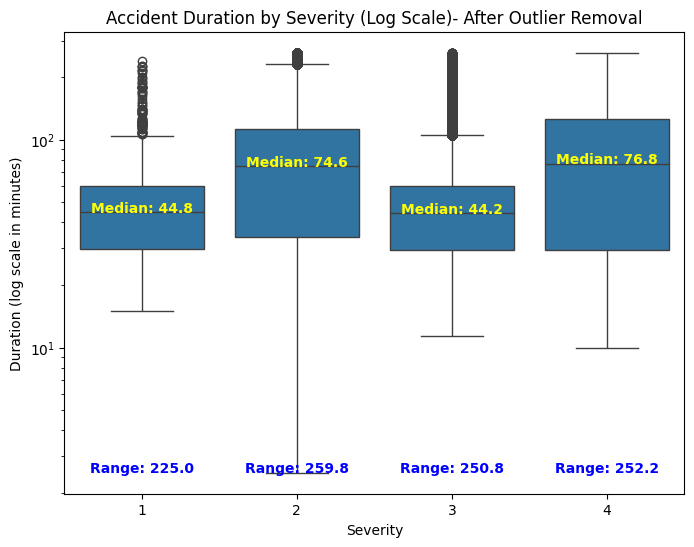

In [ ]:
# Plot the cleaned dataset using a log scale for duration
plt.figure(figsize=(8, 6))

# Create the boxplot
ax = sns.boxplot(x='Severity', y='duration', data=df_clean)
plt.yscale('log')

# Calculate medians and ranges for each severity
medians = df_clean.groupby(['Severity'])['duration'].median().values
ranges = df_clean.groupby(['Severity'])['duration'].agg(lambda x: np.ptp(x)).values  # ptp calculates range (max - min)

# Add annotations for median and range
for i, median in enumerate(medians):
    ax.text(i, median, f'Median: {median:.1f}', horizontalalignment='center', color='yellow', weight='semibold')

# Optionally add range info
for i, r in enumerate(ranges):
    ax.text(i, min(df['duration']), f'Range: {r:.1f}', horizontalalignment='center', color='blue', weight='semibold')

plt.xlabel('Severity')
plt.ylabel('Duration (log scale in minutes)')
plt.title('Accident Duration by Severity (Log Scale)- After Outlier Removal')

plt.show()

**Visualize the changes in accident durations before and after outlier removal (Log Scale):**

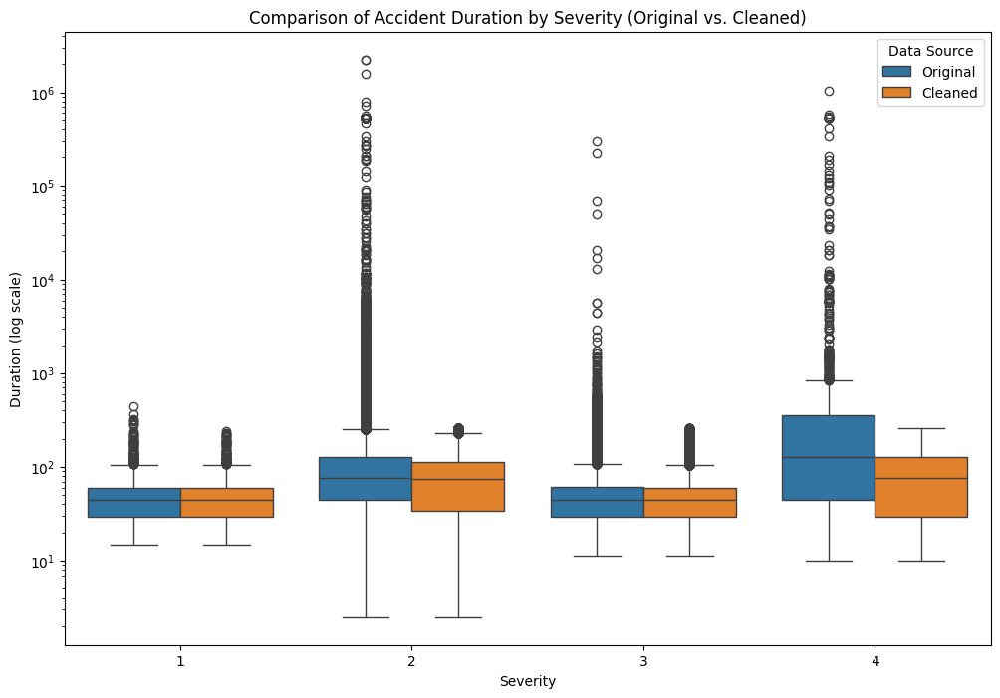

In [ ]:
df['Source_duration'] = 'Original'  # Add a column to indicate original data
df_clean['Source_duration'] = 'Cleaned'  # Add a column to indicate cleaned data

# Combine the two DataFrames
combined_df = pd.concat([df[['Severity', 'duration', 'Source_duration']], df_clean[['Severity', 'duration', 'Source_duration']]])

# Set the figure size
plt.figure(figsize=(12, 8))

# Create the boxplot
ax = sns.boxplot(x='Severity', y='duration', hue='Source_duration', data=combined_df)
plt.yscale('log')  # Use log scale for duration

# Set plot title and labels
plt.title('Comparison of Accident Duration by Severity (Original vs. Cleaned)')
plt.xlabel('Severity')
plt.ylabel('Duration (log scale)')

# Show the plot
plt.legend(title='Data Source')
plt.show()

Analyze and compare the results of accident duration statistics before and after outlier removal

1.	Mean Comparison:
	* The means for Severity 1, Severity 2, Severity 3 remained nearly unchanged after outlier removal, indicating stability in the average duration for these severities.
	* Severity 4’s mean dropped significantly from 128.6 to 76.8 minutes, suggesting that outliers had a substantial impact on these averages.
2.	Range Comparison:
	*	The ranges for all severities decreased significantly after outlier removal. This indicates that the data became more consistent and that extreme values were influencing the results before outlier removal.

3.	Implications of Changes:
	*	The reduction in range for all severities suggests that the dataset became more reliable and representative of typical accident durations, especially for Severities 2 and 4.
	*	The significant drop in mean for Severity 4 indicates that many of the extreme durations (likely long accidents or delays) were skewing the average, making it misleading.


We can clearly see that we have successfully removed the majority of outliers.

###  City

**Top 20 Cities by Number of Accidents:**

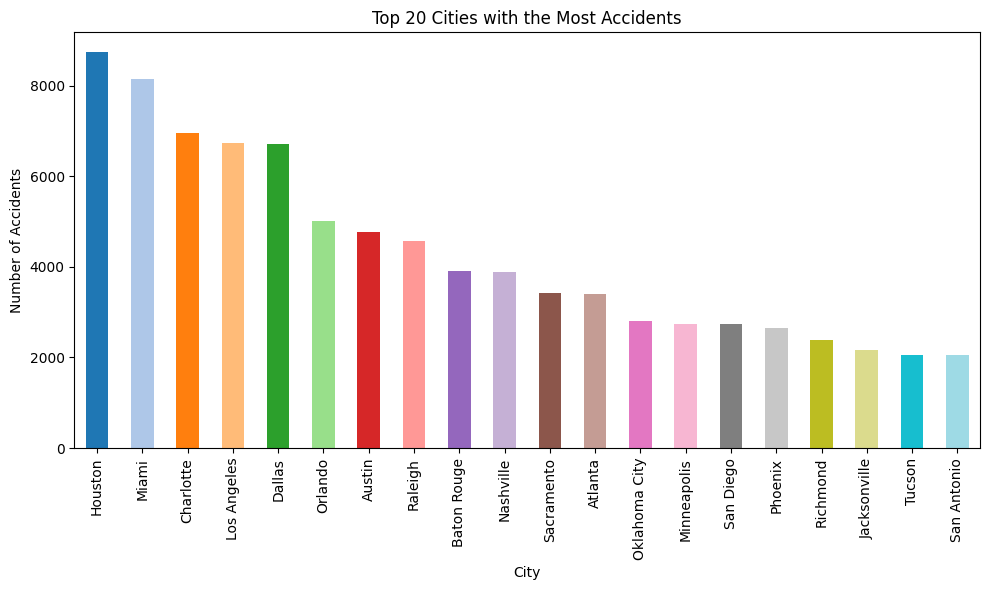

In [ ]:
# Get the top 20 cities with the most accidents
accidents_by_city = df_clean['City'].value_counts()

top_20_cities = accidents_by_city.head(20)

# Create the bar plot
plt.figure(figsize=(10, 6))
color_range = range(50)
top_20_cities.plot(kind='bar', color=plt.get_cmap('tab20')(range(len(color_range))))

plt.title('Top 20 Cities with the Most Accidents')
plt.xlabel('City')
plt.ylabel('Number of Accidents')

# Show the bar plot
plt.tight_layout()
plt.show()


**City-Level Analysis:**
Houston leads all cities with approximately 8,500 accidents, followed closely by Miami with around 8,000 accidents. Charlotte, Los Angeles, and Dallas round out the top 5 cities, each recording between 6,000-7,000 accidents.
The difference between the highest and lowest ranked cities is substantial, with San Antonio having roughly 2,000 accidents, about a quarter of Houston's total.

### State

**Top 20 States by Number of Accidents:**

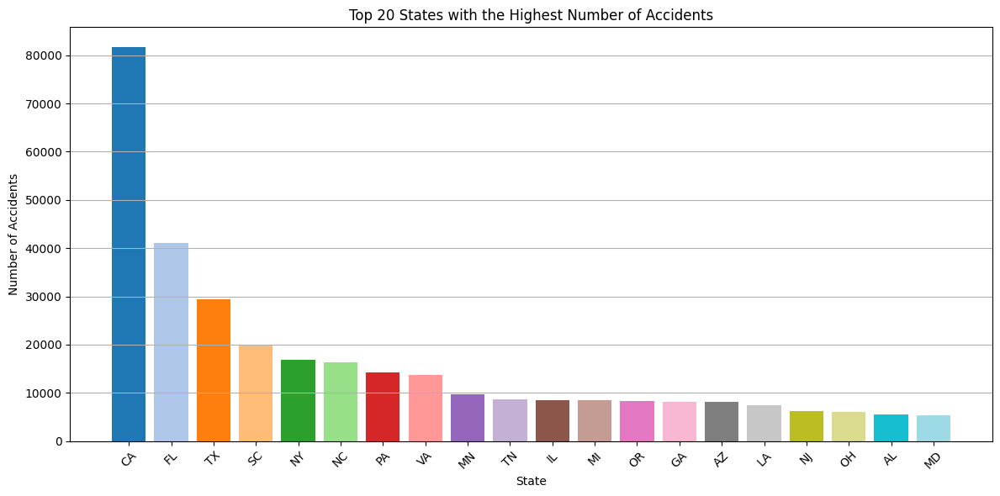

In [ ]:
# Count of accidents by state
accidents_by_state= df_clean['State'].value_counts()

#Sort the states by accident count and get the top 10
top_20_states = accidents_by_state.nlargest(20)

#Create a bar plot
plt.figure(figsize=(12, 6))
plt.bar(top_20_states.index, top_20_states.values, color=plt.get_cmap('tab20')(range(len(color_range))))
plt.title('Top 20 States with the Highest Number of Accidents')
plt.xlabel('State')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=45)
plt.grid(axis='y')

#Show the plot
plt.tight_layout()
plt.show()

**State-Level Analysis:** California stands out dramatically with around 80,000 accidents, nearly double that of the second-ranked state, Florida, which has approximately 40,000 accidents. Texas ranks third with about 30,000 accidents.

**Geographic Patterns(combine top20 cities and states)**
- Southern Dominance:
Both graphs show a strong presence of southern locations:
  * Cities: Houston, Miami, Dallas, Orlando, Austin

  * States: Florida, Texas, Georgia, Louisiana
- Population Correlation:
The data suggests a correlation between population size and accident numbers, as many of the highest-ranking locations are major population centers.
- Coastal Representation:
Coastal states and cities feature prominently in both rankings, particularly along the Atlantic and Gulf coasts.
- Scale Comparison:
The state-level accidents are approximately 10 times higher than city-level numbers, which makes sense given that states encompass multiple cities and rural areas.

### Start_Lat and Start_Lng

Shows latitude and longitude in GPS coordinate of the start point.

**Using folium to visualize the location of accidents on the map**

In [ ]:
lat_lon_pairs = list(zip(list(df_clean.Start_Lat), list(df_clean.Start_Lng)))
map = folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map

This visualization effectively highlights areas with higher accident frequencies, which could be valuable for traffic safety analysis and planning.

- Dense Coverage: Most of the continental US is covered in red, indicating widespread accident occurrences
- Coastal Concentration: Intense red coloring along the eastern and western coast, indicating high accident density

### Weather_Condition

**Most Common Weather Conditions:**

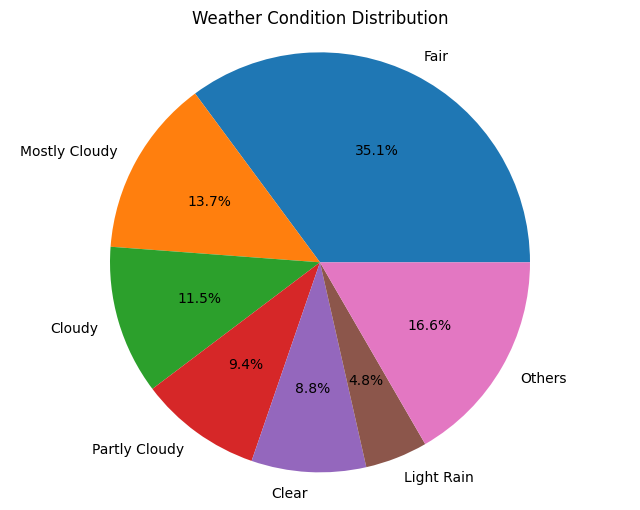

In [ ]:
# Graph the Weather conditions in a Pie Chart
weather_counts = df_clean['Weather_Condition'].value_counts()

# Group the main categories of weather conditions
top_conditions = weather_counts.head(6)
other_conditions_count = weather_counts.iloc[6:].sum()

# Create a new DataFrame with the summarized weather conditions
summary_weather_counts = pd.DataFrame(top_conditions).reset_index()
summary_weather_counts.columns = ['Weather_Condition', 'Count']

others_row = pd.DataFrame({'Weather_Condition': ['Others'], 'Count': [other_conditions_count]})
summary_weather_counts = pd.concat([summary_weather_counts, others_row], ignore_index=True)

# Plot the pie chart
plt.figure(figsize=(8, 6))
plt.pie(summary_weather_counts['Count'], labels=summary_weather_counts['Weather_Condition'], autopct='%1.1f%%')
plt.title('Weather Condition Distribution')
plt.axis('equal')
plt.show()

A bar graph is presented to visualize the distribution of climate conditions.

### Boolean columns

This section aims to uncover **patterns based on traffic characteristics**, such as identifying situations where accidents are more prevalent, such as at traffic signals, crossings, junctions, and stops.

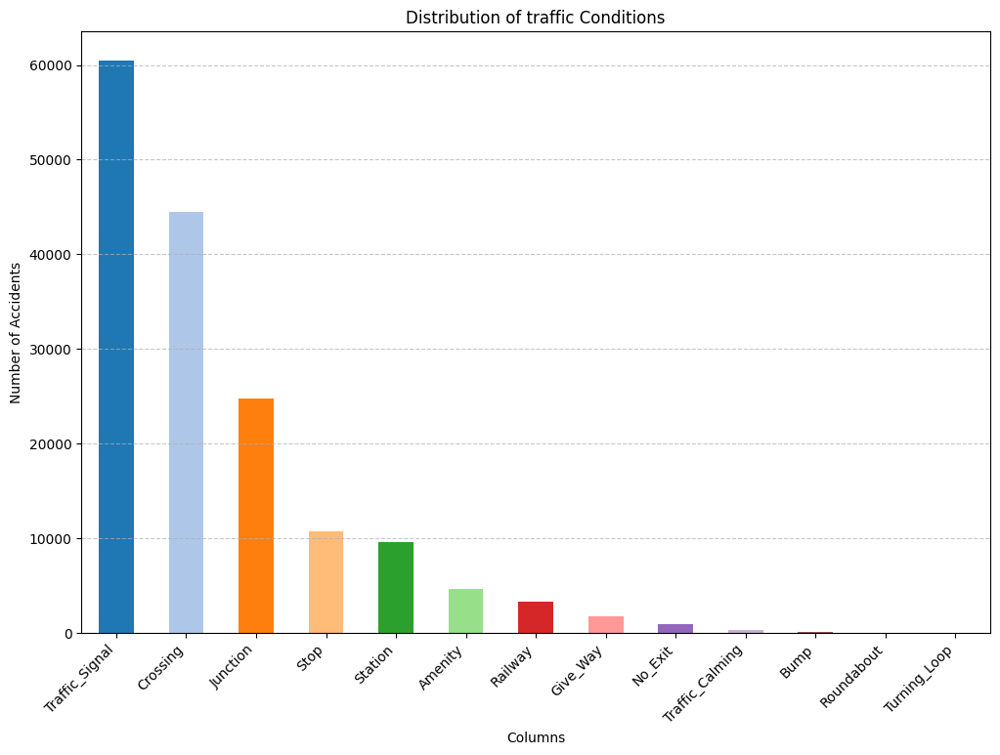

In [ ]:
boolean_columns = df_clean.select_dtypes(include=['bool']).columns.tolist()
# Plot histograms for traffic conditions
plt.figure(figsize=(12, 8))
df_clean[boolean_columns].sum().sort_values(ascending=False).plot(kind='bar', color=plt.get_cmap('tab20')(range(len(color_range))))
plt.title('Distribution of traffic Conditions')
plt.xlabel('Columns')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

The most frequent traffic conditions are:
- Traffic Signals are by far the most common traffic control feature, with approximately 60,000 occurrences
- Crossings are the second most frequent, with about 45,000 instances
- Junctions rank third, occurring roughly 25,000 times

The mid-range frequency features include:
- Stop signs and Stations appear in around 10,000 cases
- Amenity areas and Railway crossings show moderate frequencies

The least frequent traffic conditions are:
- Give Way signs
- No Exit zones
- Traffic Calming measures
- Bumps
- Roundabouts
- Turning Loops

This distribution suggests that most traffic accidents occur near major traffic control points like signals and crossings, while specialized road features like roundabouts and turning loops are less commonly associated with traffic events.


##  Correlation analysis

### Check correlation for numeric features

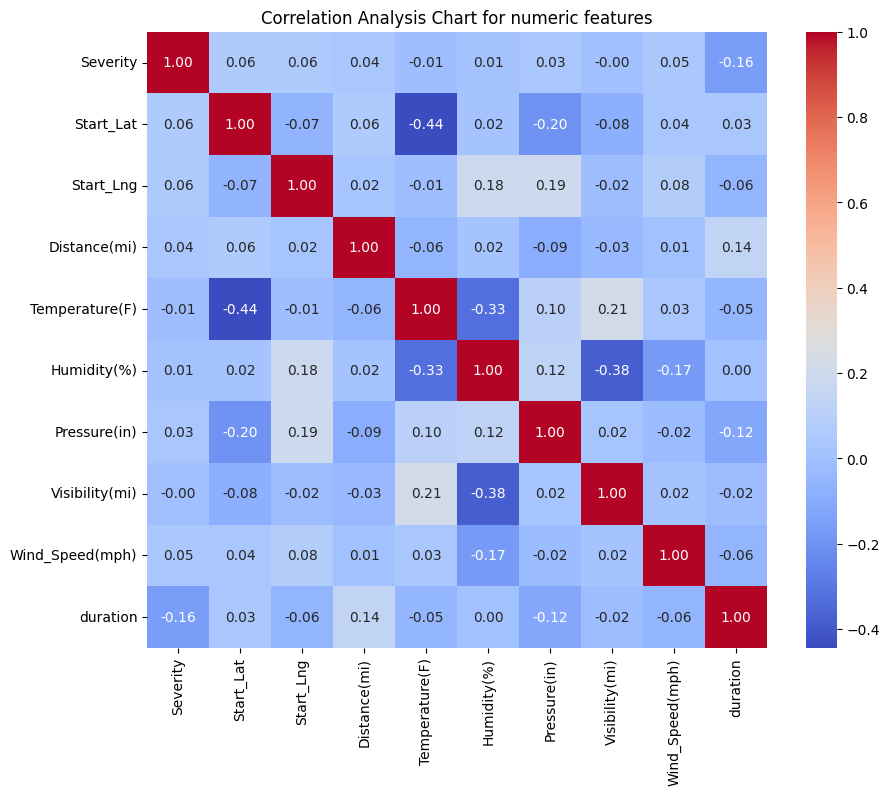

In [ ]:
num_cols = df_clean.select_dtypes(include=['float', 'int']).columns.tolist()
correlation_matrix = df_clean[num_cols].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Analysis Chart for numeric features')
plt.show()

**Top 3 Correlated Numerical Features:**
- Temperature and Start_Lng
- Humidity and Visibility
- Humidity and Temperature

### Check correlation for boolean features

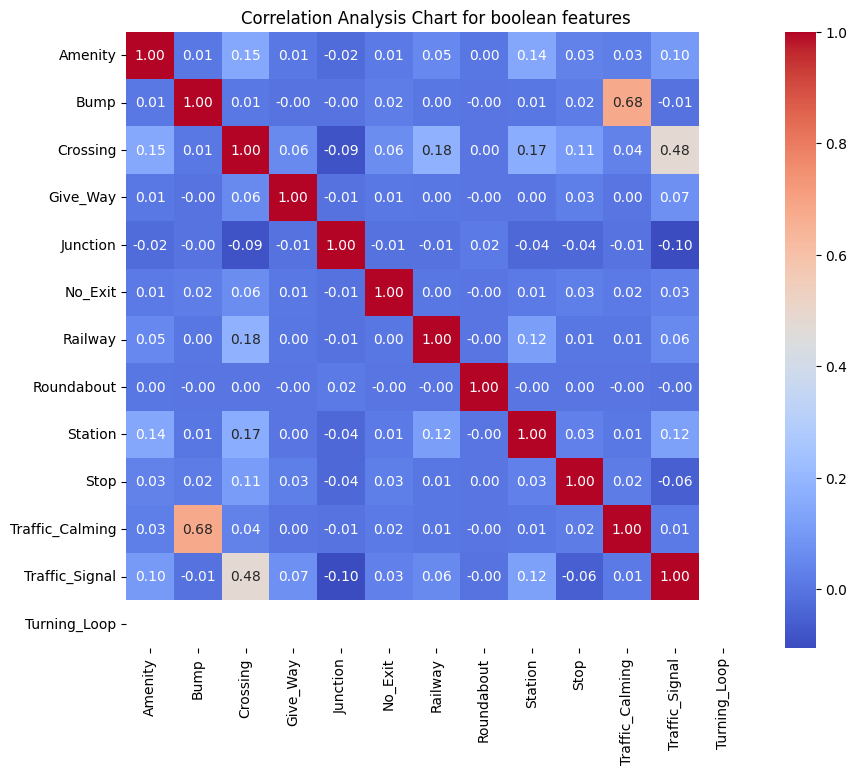

In [ ]:
df_bool_numeric = df_clean[boolean_columns].astype(int)
correlation_matrix = df_bool_numeric.corr()


plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Analysis Chart for boolean features')
plt.show()

**Top 2 Correlated Boolean Features:**
- Bump and Traffic_Claming
- Crossing and Traffic_Signal

### Check correlation for category features

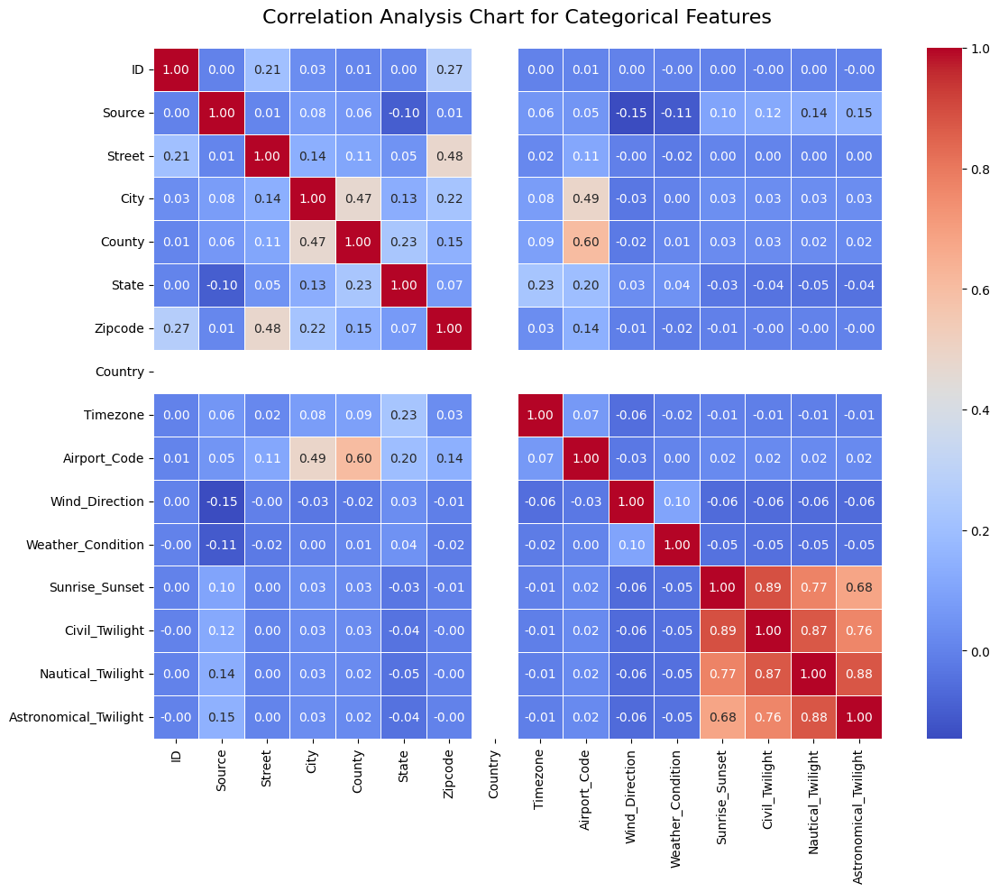

In [ ]:
# Select categorical columns
cat_cols = df_clean.select_dtypes(include=['category']).columns.tolist()

# Convert categorical columns to numeric for correlation analysis
df_numeric = df_clean[cat_cols].apply(lambda x: pd.factorize(x)[0])

# Calculate correlation matrix
correlation_matrix = df_numeric.corr()

# Create heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Analysis Chart for Categorical Features', fontsize=16, pad=20)
plt.tight_layout()
plt.show()

**Top 2 Sets of Correlated Categorical Features:**
- Sunrise_Sunset, Civil_Twilight, Nautical_Twilight, Astronomical_Twilight are highly correlated.
- Airport code is correlated with City and County.

## Summary and Insights

*  Regarding traffic conditions, the majority of  accidents involve traffic signals, crossings, or junctions.

*   Most of the data comes from Source 1 and Source2 with a smaller portion coming from Source 3. Additionally, the occurrence of accidents decreases significantly in 2023, likely due to data availability only up until March 2023.

*   The End_Lat and End_Lng data fields have 44% missing values, making them unsuitable for analysis. Similarly, precipitation and wind chill data have approximately 30% missing values.

*   The majority (78%) of accidents have a severity score of 2.

*   Two distinct patterns are observed between weekdays and weekends. Weekdays account for approximately 85% of total accidents, while weekends contribute only around 15%.

*   Peak accident times during weekdays coincide with high traffic flow, with the first peak occurring at 8:00 AM and the second at 5:00 PM. On weekends, the peak occurs at 2:00 PM, indicating sustained activity throughout the afternoon, as mornings witness significantly fewer accidents.
*   Accident rates are higher in coastal or bay areas compared to inland regions.

*   The initial analysis suggests a potential correlation between temperature and accident frequency within the range of 50°F to 80°F.

*   Analysis of meteorological conditions reveals that the majority of accidents occur under average weather conditions, suggesting no significant influence or deviation from typical weather patterns. Approximately 35.1% of accidents occur under fair weather conditions.

*   Regarding traffic conditions, the majority of accidents involve traffic signals, crossings, or junctions.





# Part 3: Feature Engineering & Pre-processing

As part of our feature engineering and pre-processing plan, we first transform some of the columns in our dataframe to create new columns we can use as features. This allows us to determine how the day of the week of the accident and time of day can impact the severity. For the day of the week, we will apply cyclic-encoding in order to capture any weekly patterns that may exist (roads busier during weekdays vs. weekends, etc.). For the time of day, we will partition each day into four 6-hour quadrants with categorical labels for simpler observation (all accidents between 6am-12pm are labeled as "Morning", 12-6pm as "Afternoon", and so on). We must also manually shift our target variable ("Severity"), which currently ranges from 1-4, to range from 0-3 instead. This is because the models require that our "y_train" and "y_test" arrays begin at the zero-th index. We then select additional features we want to train our models on based on their relevance from the EDA. Some of our features are categorical, requiring us to encode them into numerical data via One Hot Encoding (OHE) so they can fit into the model. We used OHE as it is a nominal method, and there is no inherent direction or gradient in those features.

Our data was then ready for the train-test split, but not before we assessed the class imbalance ratio to determine if we needed to stratify our samples in the dataset. Due to the extremely high class imbalance (~71:1 class ratio), we stratified the dataset when applying the 80/20 train-test split. Afterwards, we applied scaling to our numerical features in order to normalize them and reduce bias during model training.

These steps ensured that we had our main features selected and our data prepared with relevant  measures in place for appropriate model fitting and evaluation in the next section (see Part 5: Modeling).

## Feature Transformations

Here, we start by creating a copy of our cleaned dataframe which will eventually contain all of our model data. We will apply some operations to the "Start_Time" column in order to extract the day of the week as an integer value before applying cyclic encoding, and to categorize the time of day into midnight, morning, afternoon, and evening. These transformations will result in new columns that we can use as time-related features for our model and to capture periodic and cyclic relationships. This is necessary to account for the impact of time on accident severity without confusing the model based on how these features are represented or the inherent relationships within their values.

In [ ]:
df_model = df_clean.copy()

print(df_clean.columns)

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'Distance(mi)', 'Description', 'Street', 'City', 'County',
       'State', 'Zipcode', 'Country', 'Timezone', 'Airport_Code',
       'Weather_Timestamp', 'Temperature(F)', 'Humidity(%)', 'Pressure(in)',
       'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)',
       'Weather_Condition', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop', 'Sunrise_Sunset',
       'Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight',
       'duration', 'Source_duration'],
      dtype='object')


We will create a custom function that extracts the day of the week from the "Start_Time" column as a number and then create two columns that represent that value in complementary sinusoidal forms. This is to capture the cyclic nature of the days of the week, ensuring that the model recognizes the inherent circular relationship (e.g., Monday is as close to Sunday as it is to Tuesday). This will help improve the model's ability to identify patterns related to temporal cycles.

The custom function is then applied to the dataframe used for modeling to create those new columns.

In [ ]:
# Define cyclic-encoding function
def cyclic_encode_day_of_week(df, col):

  df['Day_of_Week'] = df[col].dt.dayofweek # Extracting the day of the week (0 = Monday - 6 = Sunday) as an integer

  df['day_sin'] = np.sin(2 * np.pi * df['Day_of_Week'] / 7)
  df['day_cos'] = np.cos(2 * np.pi * df['Day_of_Week'] / 7)

  return df


# Apply cyclic-encoding to create new 'day_sin' and 'day_cos' columns based on 'Day_of_Week'
df_model = cyclic_encode_day_of_week(df_model, 'Start_Time')

Now, we will create a custom function that checks when the hour of "Start_Time" is relative to our set thresholds (6am, 12pm, 6pm, 12am) and then categorizes it to a specific time period. This is then applied to the "Start_Time" column in our model dataframe to create a new dataframe named "Time_Period", which will eventually be a feature to our models.

In [ ]:
# Define a function to categorize time periods
def categorize_time_period(start_time):
    if start_time.hour < 6:
        return 'Midnight'
    elif start_time.hour < 12:
        return 'Morning'
    elif start_time.hour < 18:
        return 'Afternoon'
    else:
        return 'Evening'

# Apply the function to create a new column 'Time_Period'
df_model['Time_Period'] = df_model['Start_Time'].apply(categorize_time_period)

Currently, our target variable of "Severity" ranges from 1-4. However, our initial attempts to fit the models resulted in errors, as they expected "y_train" to begin at 0. To address this, we added this step of subtracting 1 from all values in the "Severity" column in order to shift them from 1-4 to **0-3**. This shifting ensures that the models will accept the "y_train" variable without affecting our data or any of the relationships between the class values in our target variable. Now, 0 simply maps to 1, 1 to 2, 2 to 3, and 3 to 4.

In [ ]:
# Pre-shift check
df_model['Severity'].unique()

array([2, 3, 1, 4])

In [ ]:
# Apply shift
df_model['Severity'] = df_model['Severity'] - 1

In [ ]:
# Post-shift check
df_model['Severity'].unique()

array([1, 2, 0, 3])

## Feature Selection

We choose the following features to use as part of our model. These are the factors that we believe have the highest impact on severity based on the results of the EDA and would like to investigate further via the modeling process. These features also represent factors that emergency response teams can anticipate through weather forecasts and upcoming times of day to be effectively prepared for accidents of all types. This will allow for more efficient resource allocation and readiness as these conditions arise. Lastly, the selected features are not highly correlated, with each feature providing new information that would potentially enhance a model's predictive power.

In [ ]:
relevant_features = ['Severity', 'State', 'Weather_Condition', 'Time_Period',
                     'day_sin', 'day_cos', 'duration', 'Wind_Speed(mph)']

df_model = df_model[relevant_features].dropna().reset_index(drop=True)
df_model

,Severity,State,Weather_Condition,Time_Period,day_sin,day_cos,duration,Wind_Speed(mph)
0,1,LA,Fair,Morning,0.974928,-0.222521,45.033333,5.0
1,1,MN,Wintry Mix,Afternoon,0.000000,1.000000,120.316667,15.0
2,1,CA,Fair,Midnight,-0.433884,-0.900969,147.150000,0.0
3,1,MA,Fair,Morning,0.000000,1.000000,107.050000,13.0
4,1,OR,Light Rain,Afternoon,0.781831,0.623490,240.000000,0.0
...,...,...,...,...,...,...,...,...
371846,1,OR,Light Rain,Morning,0.974928,-0.222521,20.500000,15.0
371847,1,FL,Partly Cloudy,Afternoon,-0.781831,0.623490,75.616667,13.0
371848,1,AZ,Fair,Evening,0.974928,-0.222521,125.250000,12.0
371849,2,VA,Fair,Afternoon,-0.433884,-0.900969,30.000000,14.0


## Encoding Categorical Features

First, we determine which of our features in "df_model" are categorical (non-numeric) so they can be aptly converted to numerical form for model fitting.

In [ ]:
print(df_model.dtypes)

Severity                int64
State                category
Weather_Condition    category
Time_Period            object
day_sin               float64
day_cos               float64
duration              float64
Wind_Speed(mph)       float64
dtype: object


In [ ]:
categorical_features = df_model.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_features = sorted(categorical_features)

categorical_features

['State', 'Time_Period', 'Weather_Condition']

"State", "Time_Period", and "Weather_Condition" are the categorical features we have extracted. We will now encode these specific features only, using OHE. We chose OHE as we wanted a simple and effective nominal encoder, as there is no inherent directionality in these features.

In [ ]:
# Create copy of the data set for encoding
encoded_df = df_model.copy()

# Apply OHE to the categorical features
encoder = OneHotEncoder(drop='first', sparse_output=False)

encoded_values = pd.DataFrame(encoder.fit_transform(encoded_df[categorical_features]),
                              columns=encoder.get_feature_names_out(categorical_features))


# Replace the original nominal columns with the encoded ones
encoded_df = encoded_df.drop(categorical_features, axis=1)
encoded_df = pd.concat([encoded_df, encoded_values], axis=1)

encoded_df

,Severity,day_sin,day_cos,duration,Wind_Speed(mph),State_AR,State_AZ,State_CA,State_CO,State_CT,...,Weather_Condition_Thunder / Windy,Weather_Condition_Thunder / Wintry Mix,Weather_Condition_Thunder and Hail,Weather_Condition_Thunder in the Vicinity,Weather_Condition_Thunderstorm,Weather_Condition_Thunderstorms and Rain,Weather_Condition_Widespread Dust,Weather_Condition_Widespread Dust / Windy,Weather_Condition_Wintry Mix,Weather_Condition_Wintry Mix / Windy
0,1,0.974928,-0.222521,45.033333,5.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,0.000000,1.000000,120.316667,15.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,-0.433884,-0.900969,147.150000,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1,0.000000,1.000000,107.050000,13.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,0.781831,0.623490,240.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371846,1,0.974928,-0.222521,20.500000,15.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
371847,1,-0.781831,0.623490,75.616667,13.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
371848,1,0.974928,-0.222521,125.250000,12.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
371849,2,-0.433884,-0.900969,30.000000,14.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Class Imbalance Assessment

Here, we are calculting the ratio of the majority class to the minority class in order to assess the relative amount of class imbalance for the severity scores in our dataset. We saw this during the EDA as well, with most of the accidents between 1-4 in severity having a severity of 2. This is merely to reconfirm that and quantify the sheer scale of the imbalance.

We are doing this now so we can determine whether we should stratify our dataset during the train-test split. Stratification ensures that the proportion of each severity class remains the same in our training and testing sets.

In [ ]:
# Calculate ratio of class imbalance
class_counts = encoded_df['Severity'].value_counts()
class_ratio = class_counts.max() / class_counts.min()

print(f'Severity has {class_ratio:.2f}x more observations in the majority class ({class_counts.max()}) than the minority ({class_counts.min()}) class.')

Severity has 70.96x more observations in the majority class (291298) than the minority (4105) class.


The data is highly imbalanced, so now we must stratify our data during the split.

## Train-Test Split

Now it is time to finally split our data into separate training and testing sets using a standard 80/20-split. We set the *stratify* parameter to "y", which is our target variable of severity. A random seed is also set for reproducibility.

In [ ]:
# Set random seed
seed = 23


# Split data into train and test sets
X = encoded_df.drop(columns = ['Severity']) # everything but our target variable (Severity)
y = encoded_df['Severity'] # only our target variable

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.2,
                                                    random_state = seed,
                                                    stratify = y,
                                                    shuffle = True)




## Scaling Numerical Features

After splitting the data, we extract its numerical features in and apply scaling using Standard Scaler. This is to normalize the numeric data and reduce potential bias during training.

In [ ]:
# Create numerical features list
numerical_features = df_model.drop(columns=['Severity']).select_dtypes(include='number').columns.tolist() # remove the target variable (Severity) from our list
numerical_features = sorted(numerical_features)

numerical_features

['Wind_Speed(mph)', 'day_cos', 'day_sin', 'duration']

In [ ]:
# Initialize scaler
scaler = StandardScaler()

# Fit and transform on numerical features from the training data
X_train[numerical_features] = scaler.fit_transform(X_train[numerical_features])
X_test[numerical_features] = scaler.transform(X_test[numerical_features])

# Convert X_train, y_train, X_test, y_test into numpy arrays
X_train, y_train, X_test, y_test = np.array(X_train), np.array(y_train), np.array(X_test), np.array(y_test)


print(f'Training data set has size {X_train.shape} and {y_train.shape}')
print(f'Testing data set has size {X_test.shape} and {y_test.shape}')

Training data set has size (297480, 157) and (297480,)
Testing data set has size (74371, 157) and (74371,)


The shape of the training and testing data confirms that we have a sufficient number of samples in both datasets (greater than 50,000 rows).

# Part 4: Modeling

For the modeling component, we fit our processed training data to 3 different model types and used the testing data to evaluate the performance of each. Then, we performed hyperparameter tuning for each model to improve its performance, assessed the extent of improvement, and then compared the performance between all model types. Our main metric for evaluation was **recall**. This is because we cannot rely on accuracy due to the high class imbalance in our data, making accuracy a biased metric in this case. To account for the class imbalance, we instead used recall as our metric, since false negatives (predicting different severity than actual) are far more costly in our case. Missing a high-severity condition could mean failing to address critical risks that could prevent severe accidents. Prioritizing recall will help reduce the chance that higher-severity accidents are under-predicted. However, this does come at the cost of potentially over-predicting lower-severity accidents (predicting a 3 instead of 1, for example), but we believe that it is better to be 'safe than sorry' given the large safety implications of this use case. Precision, on the other hand, is not as important to us since the cost of false positives is not as high in this case as the cost of false negatives.

## Decision Tree (Baseline Model)

We are using a simple Decision Tree Classifier as our baseline model to assess the base performance of our predictions. This is because it is a relatively simple model we can build upon using more advanced ensemble approaches, which you will see in later subsections. The simplicity of this model will also indicate whether more advanced approaches are even necessary in practical scenarios, with good performance from this model suggesting that a single decision tree is sufficient given our dataset and chosen features.

### Model Setup


For the initial setup, the max_depth=20 parameter limits the depth of the decision tree to prevent overfitting while allowing sufficient complexity to capture meaningful patterns in the data. Setting random_state=seed ensures reproducibility by fixing the randomization process used during training. The class_weight="balanced" parameter adjusts the weights of classes inversely proportional to their frequencies to help address the high class imbalance in our dataset and improve the model performance on the minority classes (e.g. Severity scores of 3 & 4).

In [ ]:
# Initialize Decision Tree Classifier
dtc = DecisionTreeClassifier(
                            max_depth=20,
                            random_state=seed,
                            class_weight="balanced")  # Adjust class weights for imbalanced data

# Fit to the training dataset
dtc.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=20, random_state=23)

### Evaluation

We will calculate testing recall to evaluate how well our model generalizes to unseen data. This will be our main way to quantify and compare model performance and predictive power across all of our models. Training recall will also be calculated to identify any potential underfitting or overfitting.

In [ ]:
# Predict using the classifier
dtc_y_train_pred = dtc.predict(X_train)
dtc_y_test_pred = dtc.predict(X_test)


# Compute metrics
dtc_training_recall_score = recall_score(y_train, dtc_y_train_pred, average='weighted')
dtc_testing_recall_score = recall_score(y_test, dtc_y_test_pred, average='weighted')


# Print results
print(f'Decision Tree Classifier Training Recall: {dtc_training_recall_score}')
print(f'Decision Tree Classifier Testing Recall: {dtc_testing_recall_score}')

Decision Tree Classifier Training Recall: 0.6221897270404733
Decision Tree Classifier Testing Recall: 0.5509405547861398


As seen above, our testing recall is not great and allows for many false negatives to exist. Now, we will perform hyperparameter tuning on this classifier to improve its performance, aiming to maximize it's recall score.

### Hyperparameter Tuning

Here, we utilize a Randomized Search over a parameter distribution. This is similar to a Grid Search, but generally runs faster at the cost of improvement. We went with this approach as the Grid Search was taking rather long times to run, making it difficult to test the validity of our code. Our TA suggested using Randomized Search to alleviate this. We are also implementing a Stratified K-Fold Cross-Validation to guarantee that our model is trained on a representative sample of each class (stratification). It is important that we implement cross-validation as well, since we did not create a separate validation set specifically for tuning purposes, and so cross-validation will avoid using the same training data during each fold of the tuning process. This will help further mitigate bias and improve overall model performance. We will fit 5 folds for 5 candidates each, resulting in 25 total fits, which we believed to be a good number of total fits while balancing efficiency.


We plan to replicate this hyperparameter tuning process with a similar parameter distribution for the other two model types (random forest and XGBoost classifiers) to allow for fair comparison and hypothesis testing of performance improvement. The only difference will be that the parameter distribution for the Decision Tree Classifier will not contain values for "n_estimators" or "bootstrap" as the model does not have these hyperparameters which are only seen in ensemble methods like random forest and gradient boosting.

For the parameter distribution we tested, the max_depth range balances model complexity, including shallow to unrestricted trees. The min_samples_split prevents over-partitioning by testing common thresholds. Finally, the min_samples_leaf range ensures robustness by avoiding overly small leaf nodes.

In [ ]:
# Define the stratified cross-validation splitter with the given seed
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

# Define the DecisionTreeClassifier with the given seed
estimator = DecisionTreeClassifier(random_state=seed)

# Define the parameter distribution with a reasonable range of hyperparameter values
param_dist = {  # Randomized search will sample from these distributions
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Define the metric as recall
scoring = 'recall'

# Set up the randomized search
dtc_search = RandomizedSearchCV(estimator=estimator,
                            param_distributions=param_dist,
                            scoring=scoring,
                            cv=cv,
                            n_iter=5,  # Number of random combinations to test
                            random_state=seed,
                            verbose=2)

# Execute the search by calling fit
dtc_search.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10; total time=   6.8s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10; total time=   5.2s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10; total time=   6.4s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10; total time=   5.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10; total time=   5.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   7.8s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   6.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   8.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   6.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   7.8s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=5; total time=   6.0s
[CV] EN

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=23, shuffle=True),
                   estimator=DecisionTreeClassifier(random_state=23), n_iter=5,
                   param_distributions={'max_depth': [10, 20, 30, None],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10]},
                   random_state=23, scoring='recall', verbose=2)

In [ ]:
# Output the best parameters and score
print("Best parameters found: ", dtc_search.best_params_)

# Use the best estimator to make predictions
tuned_dtc_model = dtc_search.best_estimator_
tuned_dtc_y_train_pred = tuned_dtc_model.predict(X_train)
tuned_dtc_y_test_pred = tuned_dtc_model.predict(X_test)

# Compute metrics using original y_test
tuned_dtc_training_recall_score = recall_score(y_train, tuned_dtc_y_train_pred, average='weighted')
tuned_dtc_testing_recall_score = recall_score(y_test, tuned_dtc_y_test_pred, average='weighted')


# Print metrics
print("Tuned Decision Tree Training Recall:", tuned_dtc_training_recall_score)
print("Tuned Decision Tree Testing Recall:", tuned_dtc_testing_recall_score)

Best parameters found:  {'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': 20}
Tuned Decision Tree Training Recall: 0.8253294339115235
Tuned Decision Tree Testing Recall: 0.7844589961140768


### Performance Comparison: Base vs. Tuned

Model performance improved by 42.39%


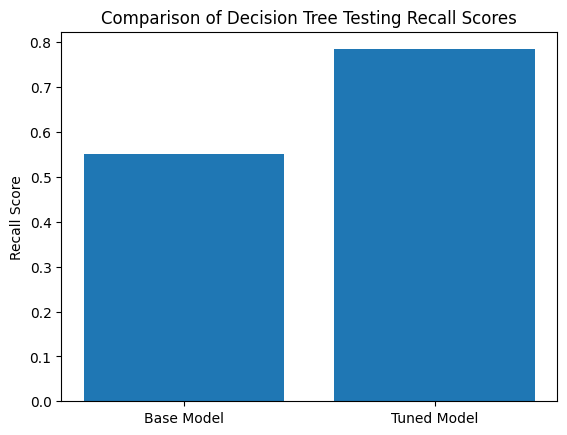

In [ ]:
# Calculate Percent Difference of Improvement
perc_diff = ((tuned_dtc_testing_recall_score - dtc_testing_recall_score) / dtc_testing_recall_score) * 100
print(f"Model performance improved by {round(perc_diff, 2)}%")

# Bar plot for comparison
plt.bar(['Base Model', 'Tuned Model'], [dtc_testing_recall_score, tuned_dtc_testing_recall_score])
plt.ylabel('Recall Score')
plt.title('Comparison of Decision Tree Testing Recall Scores')
plt.show()

Now we see a massive improvement in recall after tuning the hyperparameters to maximize this metric. This suggests that only one tree is sufficient to generalize well to new data. It also suggests that our dataset is relatively simple and may not contain any complex relationships between our features. In the upcoming subsections, we will perform this same process but using ensemble models such as the Random Forest Classifier and XGBoost Classifier, which we expect to have better performance both before and after tuning due to them using much more robust ensemble methods.

## Random Forest Classifier

Next, we will setup and evaluate a Random Forest Classifier, which is typically a much more robust ensemble approach we would expect to significantly outperform the Decision Tree Classifier. This is because this model can aggregate predictions from multiple decision trees to improve stability and reduce bias. Evaluating its performance helps determine if this approach effectively balances accuracy and computational efficiency for our dataset.

### Model Setup

We used a similar initial setup here, with the difference being that we set n_estimators=50 for a reasonable number of trees to balance performance and computational cost.

In [ ]:
# Initialize Random Forest Decision Tree Classifier
rfc = RandomForestClassifier(
                             n_estimators = 50,
                             max_depth = 20,
                             random_state = seed,
                             class_weight="balanced")  # Adjust class weights for imbalanced data


# Fit to the training dataset
rfc.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=20, n_estimators=50,
                       random_state=23)

### Evaluation

In [ ]:
# Predict using your classifier
rfc_y_train_pred = rfc.predict(X_train)
rfc_y_test_pred = rfc.predict(X_test)


# Compute metrics
rfc_training_recall_score = recall_score(y_train, rfc_y_train_pred, average='weighted')
rfc_testing_recall_score = recall_score(y_test, rfc_y_test_pred, average='weighted')


# Print results
print(f'Random Forest Classifier Training Recall: {rfc_training_recall_score}')
print(f'Random Forest Classifier Testing Recall: {rfc_testing_recall_score}')

Random Forest Classifier Training Recall: 0.6404867554121285
Random Forest Classifier Testing Recall: 0.5793118285353162


The Random Forest Classifier does perform *slightly* better than the base Decision Tree Classifier, but not by much. Therefore, we need to tune its hyperparameters as well.

### Hyperparameter Tuning

Here, we utilize a Randomized Search over a similar but slightly different parameter distribution. The difference here is that we can also evaluate the optimal number of estimators (n_estimators) and whether or not to implement bootstrapping. We are still implementing a Stratified K-Fold Cross-Validation for the same reasons as before.

The n_estimators range tests different numbers of trees to balance performance and computational cost. The max_depth range explores tree complexity to balance underfitting and overfitting. The min_samples_split range evaluates thresholds for splitting nodes to prevent over-partitioning. The min_samples_leaf range ensures leaf robustness by avoiding overly small nodes. The bootstrap option tests both sampling with and without replacement to optimize ensemble diversity.

We plan to replicate this hyperparameter tuning process for the next model as well, which will be an XGBoost classifier.

In [ ]:
# Define the stratified cross-validation splitter with the given seed
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

# Define the RandomForestClassifier with the given seed
estimator = RandomForestClassifier(random_state=seed)

# Define the parameter distribution with a reasonable range of hyperparameter values
param_dist = {  # Randomized search will sample from these distributions
    'n_estimators': [50, 100, 150],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Define the metric as recall
scoring = 'recall'

# Set up the randomized search
rfc_search = RandomizedSearchCV(estimator=estimator,
                            param_distributions=param_dist,
                            scoring=scoring,
                            cv=cv,
                            n_iter=5,  # Number of random combinations to test
                            random_state=seed,
                            verbose=2)

# Execute the search by calling fit
rfc_search.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] END bootstrap=False, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time= 1.6min
[CV] END bootstrap=False, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time= 1.7min
[CV] END bootstrap=False, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time= 1.6min
[CV] END bootstrap=False, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time= 1.7min
[CV] END bootstrap=False, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time= 1.6min
[CV] END bootstrap=True, max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  49.7s
[CV] END bootstrap=True, max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  50.0s
[CV] END bootstrap=True, max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; tot

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=23, shuffle=True),
                   estimator=RandomForestClassifier(random_state=23), n_iter=5,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, None],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 100, 150]},
                   random_state=23, scoring='recall', verbose=2)

In [ ]:
# Output the best parameters and score
print("Best parameters found: ", rfc_search.best_params_)

# Use the best estimator to make predictions
tuned_rfc_model = rfc_search.best_estimator_
tuned_rfc_y_train_pred = tuned_rfc_model.predict(X_train)
tuned_rfc_y_test_pred = tuned_rfc_model.predict(X_test)

# Compute metrics using original y_test
tuned_rfc_training_recall_score = recall_score(y_train, tuned_rfc_y_train_pred, average='weighted')
tuned_rfc_testing_recall_score = recall_score(y_test, tuned_rfc_y_test_pred, average='weighted')


# Print metrics
print("Tuned Random Forest Training Recall:", tuned_rfc_training_recall_score)
print("Tuned Random Forest Testing Recall:", tuned_rfc_testing_recall_score)

Best parameters found:  {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': None, 'bootstrap': False}
Tuned Random Forest Training Recall: 0.8208988839585855
Tuned Random Forest Testing Recall: 0.7940864046469727


### Performance Comparison: Base vs. Tuned

Model performance improved by 37.07%


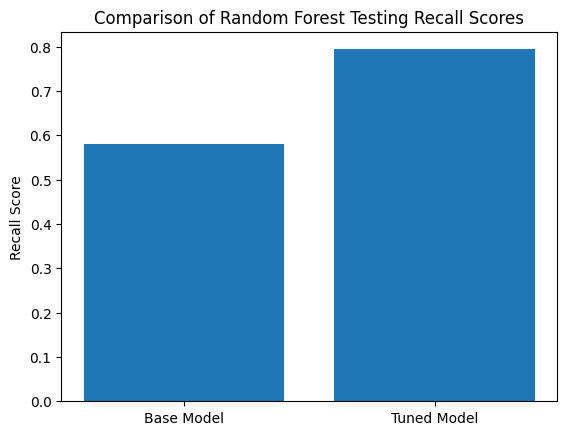

In [ ]:
# Calculate Percent Difference of Improvement
perc_diff = ((tuned_rfc_testing_recall_score - rfc_testing_recall_score) / rfc_testing_recall_score) * 100
print(f"Model performance improved by {round(perc_diff, 2)}%")

# Bar plot for comparison
plt.bar(['Base Model', 'Tuned Model'], [rfc_testing_recall_score, tuned_rfc_testing_recall_score])
plt.ylabel('Recall Score')
plt.title('Comparison of Random Forest Testing Recall Scores')
plt.show()

As expected, we see a massive improvement in recall after tuning the hyperparameters, although the rate of improvement is slightly lower than that for the Decision Tree Classifier (38% vs. 42%). The final testing recall score for this model is also only ~1% higher than that of the Decision Tree. This made us question the necessity of using this more computationally-demanding Random Forest approach since we still have to perform extensive hyperparameter tuning just to get very similar results. We expected Random Forest to significantly outperform the Decision Tree because it builds and aggregates predictions from multiple trees. This requires more computational power, but typically yields improved accuracy, robustness, and generalization compared to a single decision tree. However, we are not seeing this same advantage, making this model unsuitable for our use case.

## XGBoost Classifier

The last model we will evaluate is XGBoost. This is because it uses iterative gradient boosting techniques to build decision trees based on the residuals of prior trees. This makes the model robust for handling imbalanced data, emphasizing important features, and minimizing false negatives. Given that our main metric is recall (minimize false negatives) and our dataset is highly imbalanced, we believe that this model has a good inductive bias for the problem we are trying to solve. In other words, the assumptions and design of the XGBoost Classifier are well-suited to our use case of predicting car accident severity using our selected features, improving the model's generalization to unseen data.

### Model Setup

For the initial setup, tree_method='hist' optimizes training speed and memory usage for large datasets. The scale_pos_weight=class_ratio addresses class imbalance by weighting classes based on our calculated class ratio from the pre-processing step (See Part 4). The n_estimators=50 sets a manageable number of boosting rounds to balance training time and model performance, similar to the value initially used for the Random Forest model.

In [ ]:
# Initialize XGBoost Classifier
xgb = XGBClassifier(random_state = seed,
                          tree_method = 'hist',
                          scale_pos_weight = class_ratio, # Using the imbalance ratio we calculated during the pre-processing section
                          n_estimators = 50)



# Fit to the training dataset
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

### Evaluation

In [ ]:
# Predict using your classifier
xgb_y_train_pred = xgb.predict(X_train)
xgb_y_test_pred = xgb.predict(X_test)


# Compute metrics
xgb_training_recall_score = recall_score(y_train, xgb_y_train_pred, average='weighted')
xgb_testing_recall_score = recall_score(y_test, xgb_y_test_pred, average='weighted')


# Print results
print(f'XGBoosting Training Recall: {xgb_training_recall_score}')
print(f'XGBoosting Testing Recall: {xgb_testing_recall_score}')

XGBoosting Training Recall: 0.8036607503025414
XGBoosting Testing Recall: 0.7990883543316616


Interestingly, the **untuned** XGBoost classifier **outperforms** both tuned models with regards to recall score. This aligns with our initial expectations around XGBoost's good inductive bias for our problem. Now, we will tune this model to see if we can further improve its performance.

### Hyperparameter Tuning

In [ ]:
# Define the stratified cross-validation splitter with the given seed
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

# Define the XGBClassifier with the given seed
estimator = XGBClassifier(random_state=seed)

# Define the parameter distribution with a reasonable range of hyperparameter values
param_dist = {  # Randomized search will sample from these distributions
    'n_estimators': [50, 100, 150],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Define the metric as recall
scoring = 'recall'

# Set up the randomized search
xgb_search = RandomizedSearchCV(estimator=estimator,
                            param_distributions=param_dist,
                            scoring=scoring,
                            cv=cv,
                            n_iter=5,  # Number of random combinations to test
                            random_state=seed,
                            verbose=2)

# Execute the search by calling fit
xgb_search.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] END bootstrap=False, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=  35.1s
[CV] END bootstrap=False, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=  36.1s
[CV] END bootstrap=False, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=  33.6s
[CV] END bootstrap=False, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=  33.6s
[CV] END bootstrap=False, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=  35.1s
[CV] END bootstrap=True, max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time= 1.3min
[CV] END bootstrap=True, max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time= 1.3min
[CV] END bootstrap=True, max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; tot

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=23, shuffle=True),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importan...
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=23, ...),
                   n_iter=5,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, None],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 100, 150]},
                   random_state=23, scoring='recall', verbose=2)

In [ ]:
# Output the best parameters and score
print("Best parameters found: ", xgb_search.best_params_)

# Use the best estimator to make predictions
tuned_xgb_model = xgb_search.best_estimator_
tuned_xgb_y_train_pred = tuned_xgb_model.predict(X_train)
tuned_xgb_y_test_pred = tuned_xgb_model.predict(X_test)

# Compute metrics using original y_test
tuned_xgb_training_recall_score = recall_score(y_train, tuned_xgb_y_train_pred, average='weighted')
tuned_xgb_testing_recall_score = recall_score(y_test, tuned_xgb_y_test_pred, average='weighted')


# Print metrics
print("Tuned Decision Tree Training Recall:", tuned_xgb_training_recall_score)
print("Tuned Decision Tree Testing Recall:", tuned_xgb_testing_recall_score)

Best parameters found:  {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': None, 'bootstrap': False}
Tuned Decision Tree Training Recall: 0.8079232217291918
Tuned Decision Tree Testing Recall: 0.8007153325893157


### Performance Comparison: Base vs. Tuned

Model performance improved by 0.2%


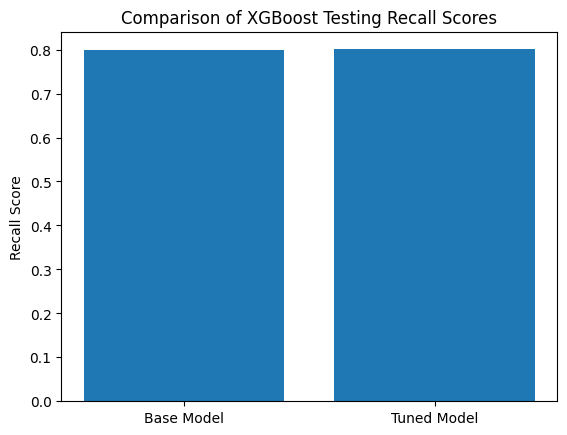

In [ ]:
# Calculate Percent Difference of Improvement
perc_diff = ((tuned_xgb_testing_recall_score - xgb_testing_recall_score) / xgb_testing_recall_score) * 100
print(f"Model performance improved by {round(perc_diff, 2)}%")

# Bar plot for comparison
plt.bar(['Base Model', 'Tuned Model'], [xgb_testing_recall_score, tuned_xgb_testing_recall_score])
plt.ylabel('Recall Score')
plt.title('Comparison of XGBoost Testing Recall Scores')
plt.show()

It seems that tuning the model's hyperparameters led to a rather negligible increase in recall score. Given the computational expense and time to do this tuning, this tuning step may not even be needed in more practical scenarios, especially given the inherent robustness of this model towards our use case.

## Final Model Comparison

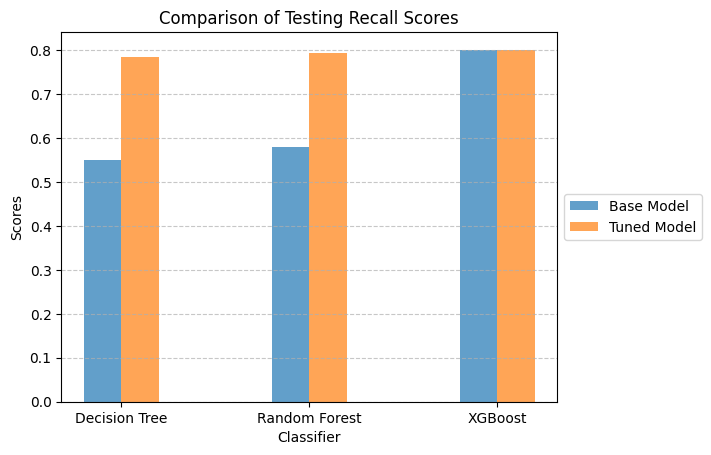

<Figure size 1500x1000 with 0 Axes>

In [ ]:
# Data for the bar plot
classifiers = ['Decision Tree', 'Random Forest', 'XGBoost']
base_testing_recall_scores = [
    dtc_testing_recall_score,
    rfc_testing_recall_score,
    xgb_testing_recall_score,
]

tuned_testing_recall_scores = [
    tuned_dtc_testing_recall_score,
    tuned_rfc_testing_recall_score,
    tuned_xgb_testing_recall_score,
]

# Create a bar plot
x = range(len(classifiers))
width = 0.20  # Width of the bars

# Plot base model recall scores
plt.bar(x, base_testing_recall_scores, width, label='Base Model', alpha=0.7)
# Plot tuned model recall scores
plt.bar(
    [i + width for i in x],
    tuned_testing_recall_scores,
    width,
    label='Tuned Model',
    alpha=0.7,
)

# Add labels, title, and legend
plt.xlabel('Classifier')
plt.ylabel('Scores')
plt.title('Comparison of Testing Recall Scores')
plt.xticks([i + width / 2 for i in x], classifiers)  # Adjust x-axis ticks
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Outside on the right
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot

plt.figure(figsize=(15, 10))
plt.show()

We see our primary metric of recall increase as we go from our baseline Decision Tree classifier to the more robust Random Forest and XGBoost classifiers, and then even more so after applying hyperparameter tuning to all classifier types. The tuning led to a significantly higher increase in our primary metric of recall for the Decision Tree and the Random Forest models. XGBoost, on the other hand, greatly outperformed both models even without tuning, and tuning caused only a small increase in recall score. Therefore, the tuned XGBoost classifier is our best-performing model for maximizing recall in order to minimize the false negative rate (reduce the chance that higher-severity accidents are under-predicted). The training recall scores were also not too high or too low for the tuned models, suggesting no underfitting or overfitting.

Regarding why XGBoost performed the best, we believe that this is due to its iterative boosting approach. This method focuses on correcting errors made by earlier trees, including misclassified minority class samples. This process allows XGBoost to continuously refine its focus on harder-to-predict instances, improving recall for imbalanced data at a better rate than the random forest and decision tree models. Tuning XGBoost led to a negligible increase in performance, further suggesting that XGBoost's unique ensemble approach was sufficient in predicting Severity without requiring additional compute resources via tuning. It may be possible to perform an even more extensive grid search to find the utmost optimal parameters for the XGBoost, but this could turn out to be extremely computationally demanding (as we saw initially before pivoting to randomized search), and yield negligible improvement.

The final takeaway is that in more practical scenarios, there is an opportunity to balance ease of use and efficiency with performance. Therefore, we recommend to either use the untuned XGBoost or the tuned Decision Tree models. The untuned XGBoost had a great inductive bias for our problem, resulting in a good testing recall score (79.9%) just by using the initial parameters we started with, which were similar to those used initial Random Forest and Decision Tree models. This completely eliminates the need for hyperparameter tuning, allowing for savings on compute time and resources by simply using this model 'off the shelf'. On the other hand, the tuned Decision Tree also yielded a good final testing recall score (78.4%) which was slightly lower than that of XGBoost, but used an extremely simple approach that was less computationally expensive.

Therefore, either of these approaches will allow for a good balance of efficiency and performance for rapid deployment and integration of the model. This is crucial for time-sensitive emergency response scenarios, such as with severe car accidents. The ease of integration of these models with existing systems ensures quick adoption, allowing police, fire, and ambulance teams to make data-driven decisions with high velocity.

# Part 5: Class-specific performance analysis

In this analysis, we examined whether the Decision Tree model performs equally well across all accident severity classes (ranging from low to high severity). This helps us understand if the model is consistent or if it struggles with predicting certain types of accidents.

Classification Report for Tuned Decision Tree:
              precision    recall  f1-score   support

  Severity 1       0.38      0.16      0.23       821
  Severity 2       0.82      0.94      0.87     58260
  Severity 3       0.50      0.26      0.34     13944
  Severity 4       0.14      0.03      0.04      1346

    accuracy                           0.78     74371
   macro avg       0.46      0.35      0.37     74371
weighted avg       0.74      0.78      0.75     74371



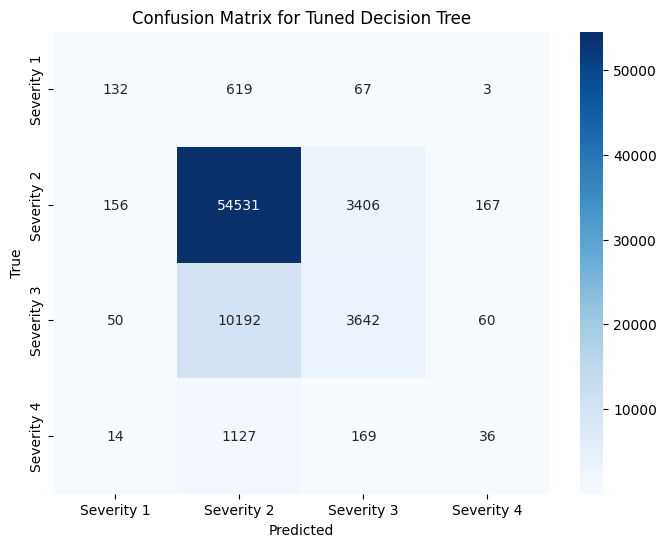

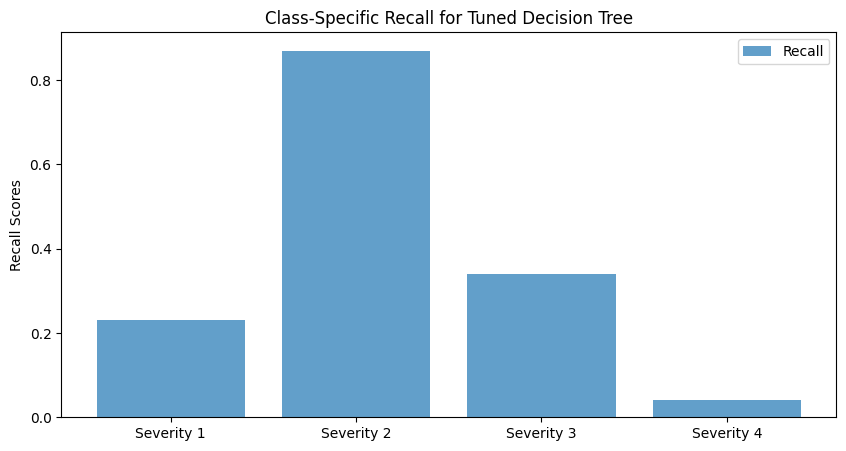

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Generate confusion matrix and classification report for the tuned model
conf_matrix_tuned_dtc = confusion_matrix(y_test, tuned_dtc_y_test_pred)

# Classification report for the tuned model
class_report_tuned_dtc = classification_report(
    y_test,
    tuned_dtc_y_test_pred,
    target_names=["Severity 1", "Severity 2", "Severity 3", "Severity 4"]
)
print("Classification Report for Tuned Decision Tree:")
print(class_report_tuned_dtc)

# Visualize the confusion matrix for the tuned model
plt.figure(figsize=(8, 6))
sns.heatmap(
    conf_matrix_tuned_dtc,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Severity 1", "Severity 2", "Severity 3", "Severity 4"],
    yticklabels=["Severity 1", "Severity 2", "Severity 3", "Severity 4"]
)
plt.title("Confusion Matrix for Tuned Decision Tree")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# Extract class-specific recall from the classification report
recall_values_tuned = []

# Parse classification report for recall
for line in class_report_tuned_dtc.split("\n")[2:6]:  # Adjust lines for class-specific metrics
    metrics = line.split()
    recall_values_tuned.append(float(metrics[-2]))

# Plot Class-Specific Recall for Tuned Decision Tree
x = ["Severity 1", "Severity 2", "Severity 3", "Severity 4"]

plt.figure(figsize=(10, 5))
plt.bar(x, recall_values_tuned, alpha=0.7, label="Recall")
plt.title("Class-Specific Recall for Tuned Decision Tree")
plt.ylabel("Recall Scores")
plt.legend()
plt.show()


**Summary of Findings:**
The model demonstrates strong performance in identifying the most common type of accidents (Severity 2), which is the majority class in the dataset. While it faces challenges in predicting less frequent accident severities (Severity 1 and 4), this behavior is expected given the natural imbalance in the dataset. The high recall for Severity 2 ensures that the model captures the bulk of accidents accurately, which is a valuable outcome.

# Appendix (EDA)

## Investigate pairs of features which have the exact same amount of null values

**"Sunrise_Sunset", "Civil_Twilight", "Nautical_Twilight", "Astronomical_Twilight" with  Null Percentage 0.3%**

In [ ]:
features_to_check = ["Sunrise_Sunset", "Civil_Twilight", "Nautical_Twilight", "Astronomical_Twilight"]
df_with_nulls = df_appendix[df_appendix['Sunrise_Sunset'].isnull()]
df_with_nulls[features_to_check].info()

<class 'pandas.core.frame.DataFrame'>
Index: 1483 entries, 1919 to 499472
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   Sunrise_Sunset         0 non-null      category
 1   Civil_Twilight         0 non-null      category
 2   Nautical_Twilight      0 non-null      category
 3   Astronomical_Twilight  0 non-null      category
dtypes: category(4)
memory usage: 17.9 KB


Here we see the 4 features have the same amount of null values, in a dataframe that is specified to only rows where Sunrise_Sunset has null values. This means that these features have null values at the exact same positions: Sunrise_Sunset, Civil_Twilight, Nautical_Twilight, Astronomical_Twilight

**"Start_Time", "End_Time" with Null Percentage 9.6%**

In [ ]:
features_to_check = ["Start_Time", "End_Time"]
df_with_nulls = df_appendix[df_appendix['Start_Time'].isnull()]
df_with_nulls[features_to_check].info()

<class 'pandas.core.frame.DataFrame'>
Index: 48163 entries, 1 to 499976
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Start_Time  0 non-null      datetime64[ns]
 1   End_Time    0 non-null      datetime64[ns]
dtypes: datetime64[ns](2)
memory usage: 1.1 MB


Start_Time and End_Time have null values at the exact same rows.

**"End_Lat", "End_Lng" with Null Percentage 44%**

In [ ]:
features_to_check = ["End_Lat", "End_Lng"]
df_with_nulls = df_appendix[df_appendix['End_Lat'].isnull()]
df_with_nulls[features_to_check].info()

<class 'pandas.core.frame.DataFrame'>
Index: 220377 entries, 0 to 499991
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   End_Lat  0 non-null      float64
 1   End_Lng  0 non-null      float64
dtypes: float64(2)
memory usage: 5.0 MB


End_Lat and End_Lng have null values at the exact same rows.

## Accident occurrences trend for all data

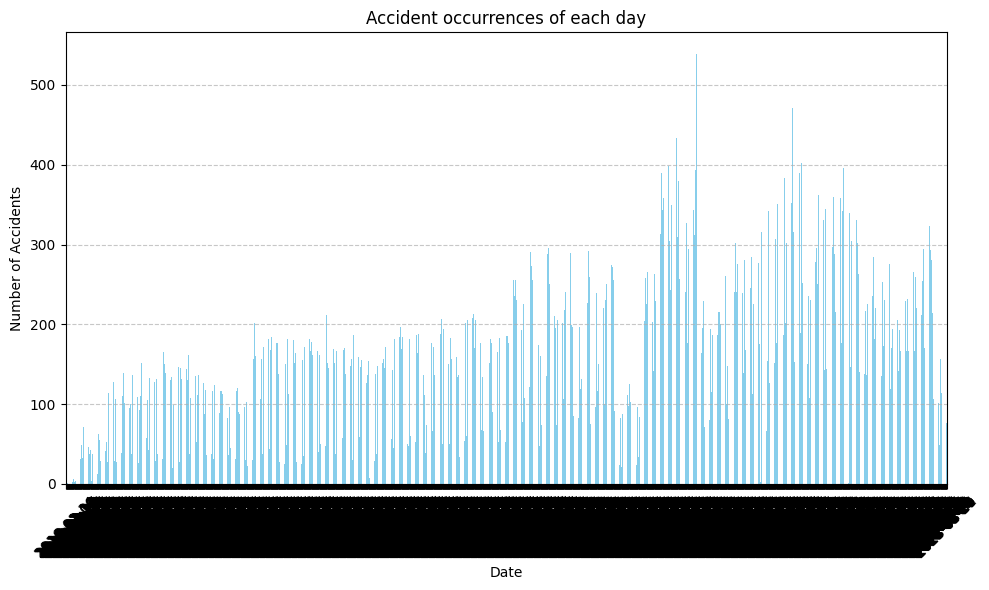

In [ ]:
def plot_time(df, date_feature):
    df_c = df.copy()
    # Extract dates from datetime column
    df_c['Date'] = df[date_feature].dt.date

    # Count occurrences of each date
    date_counts = df_c['Date'].value_counts().sort_index()

    # Plot histogram
    plt.figure(figsize=(10, 6))
    date_counts.plot(kind='bar', color='skyblue')
    plt.title('Accident occurrences of each day')
    plt.xlabel('Date')
    plt.ylabel('Number of Accidents')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
plot_time(df, "Start_Time")

There is a clear upward trend in the count of accidents over time, with more recent dates showing higher frequencies.
The counts range roughly from under 100 to over 500 events per date


## Week vs Severity

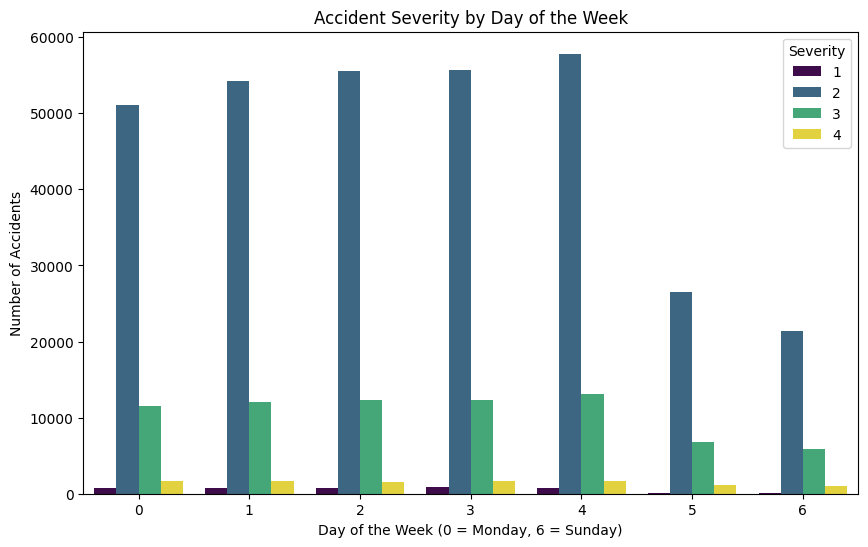

In [ ]:
# Plot the relationship between day of the week and severity
plt.figure(figsize=(10, 6))
sns.countplot(x=dayofweek, hue='Severity', data=df, palette='viridis')
plt.xlabel('Day of the Week (0 = Monday, 6 = Sunday)')
plt.ylabel('Number of Accidents')
plt.title('Accident Severity by Day of the Week')
plt.legend(title='Severity')
plt.show()

From the relationship between day of the week and severity, there is no clear trend to interpret, since we know the majority of accient severity is 2.

## Hour vs Severity

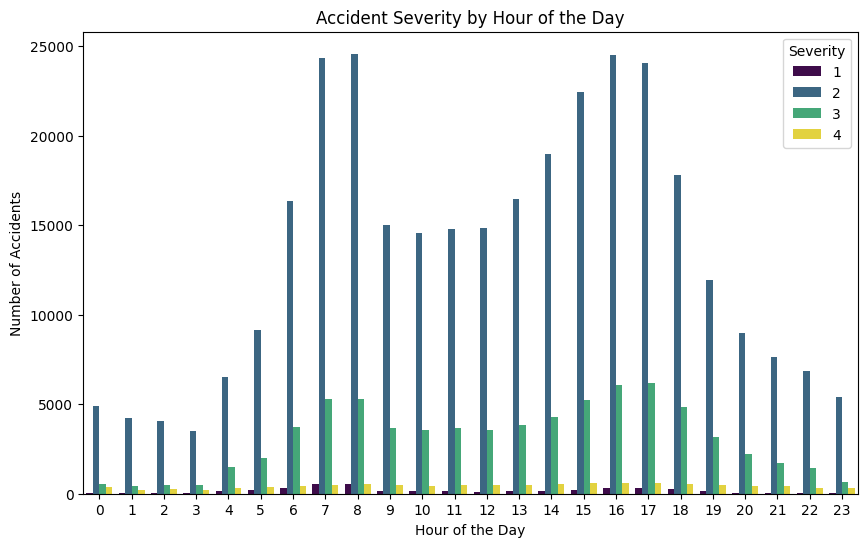

In [ ]:
# Plot the relationship between hour and severity
plt.figure(figsize=(10, 6))
sns.countplot(x=hour, hue='Severity', data=df, palette='viridis')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Accident Severity by Hour of the Day')
plt.legend(title='Severity')
plt.show()

Again, there is no clear relationship between accident severity and hour.Since  majority of severity is 2.

## Analysis Top 3 States with highest frequency accidents

The analysis focuses on the top three states with the highest accident rates.

### Analysis by Weather

This part aims to discern the impact of weather conditions on accident occurrences by examining factors such as temperature, humidity, and wind speed. These factors are juxtaposed with annual average values to highlight deviations from the norm.

**Temperature(F)**

Since California, Texas, and Florida have most accidents, we want to explore impact of Temperature(F) on Top3 states of accident occurrences.

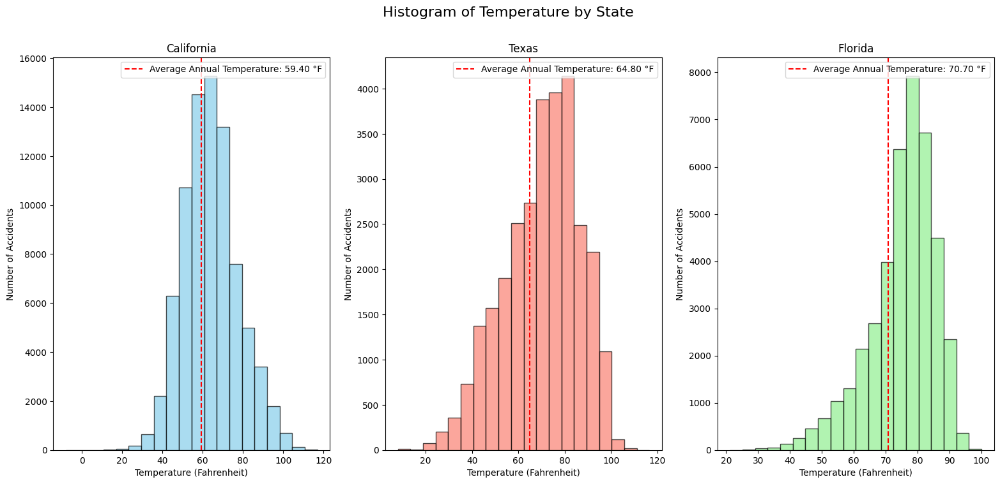

In [ ]:
# Filter data for California, Texas, and Florida
california_data = df_clean[df_clean['State'] == 'CA']['Temperature(F)']
texas_data = df_clean[df_clean['State'] == 'TX']['Temperature(F)']
florida_data = df_clean[df_clean['State'] == 'FL']['Temperature(F)']

# Calculate mean temperatures for each state from https://www.currentresults.com/Weather/US/average-annual-state-temperatures.php
california_mean_temp = 59.4
texas_mean_temp = 64.8
florida_mean_temp = 70.7

# Create subplots for each state
fig, axes = plt.subplots(1, 3, figsize=(19, 8))

# California
axes[0].hist(california_data, bins=20, color='skyblue', edgecolor='black', alpha=0.7)
axes[0].axvline(california_mean_temp, color='red', linestyle='--', linewidth=1.5, label=f'Average Annual Temperature: {california_mean_temp:.2f} °F')
axes[0].set_title('California')
axes[0].set_xlabel('Temperature (Fahrenheit)')
axes[0].set_ylabel('Number of Accidents')
axes[0].legend()

# Texas
axes[1].hist(texas_data, bins=20, color='salmon', edgecolor='black', alpha=0.7)
axes[1].axvline(texas_mean_temp, color='red', linestyle='--', linewidth=1.5, label=f'Average Annual Temperature: {texas_mean_temp:.2f} °F')
axes[1].set_title('Texas')
axes[1].set_xlabel('Temperature (Fahrenheit)')
axes[1].set_ylabel('Number of Accidents')
axes[1].legend()

# Florida
axes[2].hist(florida_data, bins=20, color='lightgreen', edgecolor='black', alpha=0.7)
axes[2].axvline(florida_mean_temp, color='red', linestyle='--', linewidth=1.5, label=f'Average Annual Temperature: {florida_mean_temp:.2f} °F')
axes[2].set_title('Florida')
axes[2].set_xlabel('Temperature (Fahrenheit)')
axes[2].set_ylabel('Number of Accidents')
axes[2].legend()

plt.suptitle('Histogram of Temperature by State', fontsize=16)

plt.show()

**Temerature vs Accidents:**
- Across all three states, accidents are most frequent in moderate temperature ranges (50°F to 80°F).
- Extreme temperatures (both hot and cold) correlate with fewer accidents, possibly due to reduced traffic
- The data suggests that moderate temperatures, which may encourage more road activity, correlate with higher accident frequencies. Drivers may be less cautious in such conditions, contributing to accidents.

**Humidity**

Since California, Texas, and Florida have most accidents, we want to explore impact of Humidity(%) on Top3 states of accident occurrences.

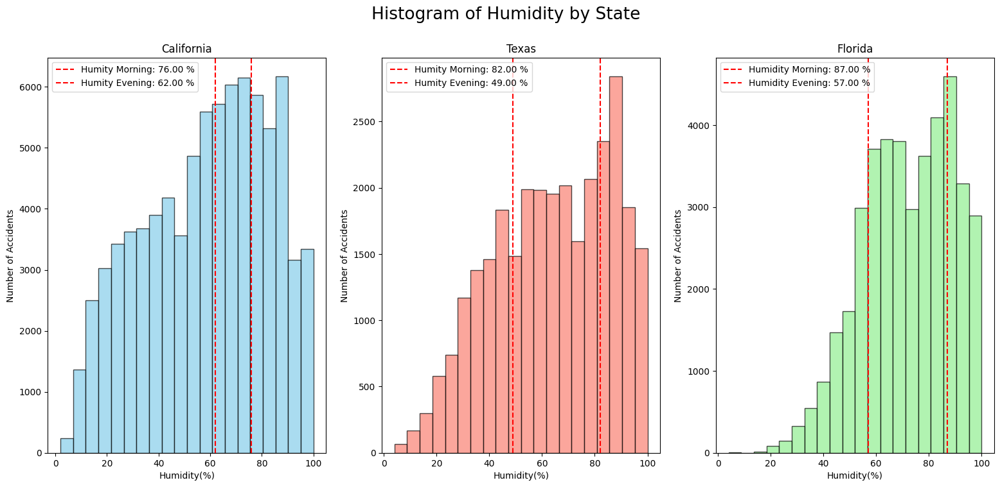

In [ ]:
#Filter data for California, Texas, and Florida
california_data = df_clean[df_clean['State'] == 'CA']['Humidity(%)']
texas_data = df_clean[df_clean['State'] == 'TX']['Humidity(%)']
florida_data = df_clean[df_clean['State'] == 'FL']['Humidity(%)']

# from https://www.currentresults.com/Weather/US/annual-average-humidity-by-state.php
california_mean_humity_morning = 76
california_mean_humity_night = 62
texas_mean_humity_morning = 82
texas_mean_humity_night = 49
florida_mean_humity_morning = 87
florida_mean_humity_night = 57

# Create subplots for each state
fig, axes = plt.subplots(1, 3, figsize=(19, 8))

# California
axes[0].hist(california_data, bins=20, color='skyblue', edgecolor='black', alpha=0.7)
axes[0].axvline(california_mean_humity_morning, color='red', linestyle='--', linewidth=1.5, label=f'Humity Morning: {california_mean_humity_morning:.2f} %')
axes[0].axvline(california_mean_humity_night, color='red', linestyle='--', linewidth=1.5, label=f'Humity Evening: {california_mean_humity_night:.2f} %')
axes[0].set_title('California')
axes[0].set_xlabel('Humidity(%)')
axes[0].set_ylabel('Number of Accidents')
axes[0].legend()

# Texas
axes[1].hist(texas_data, bins=20, color='salmon', edgecolor='black', alpha=0.7)
axes[1].axvline(texas_mean_humity_morning, color='red', linestyle='--', linewidth=1.5, label=f'Humity Morning: {texas_mean_humity_morning:.2f} %')
axes[1].axvline(texas_mean_humity_night, color='red', linestyle='--', linewidth=1.5, label=f'Humity Evening: {texas_mean_humity_night:.2f} %')
axes[1].set_title('Texas')
axes[1].set_xlabel('Humidity(%)')
axes[1].set_ylabel('Number of Accidents')
axes[1].legend()

# Florida
axes[2].hist(florida_data, bins=20, color='lightgreen', edgecolor='black', alpha=0.7)
axes[2].axvline(florida_mean_humity_morning, color='red', linestyle='--', linewidth=1.5, label=f'Humidity Morning: {florida_mean_humity_morning:.2f} %')
axes[2].axvline(florida_mean_humity_night, color='red', linestyle='--', linewidth=1.5, label=f'Humidity Evening: {florida_mean_humity_night:.2f} %')
axes[2].set_title('Florida')
axes[2].set_xlabel('Humidity(%)')
axes[2].set_ylabel('Number of Accidents')
axes[2].legend()

plt.suptitle('Histogram of Humidity by State', fontsize=19)

plt.show()


**Humidity vs. Accidents:**
- Humidity Levels and Accidents: Higher humidity seems to correlate with increased accident frequency in all three states.



**Wind_Speed(mph)**

Since California, Texas, and Florida have most accidents, we want to explore impact of Wind_Speed(mph) on Top3 states of accident occurrences.

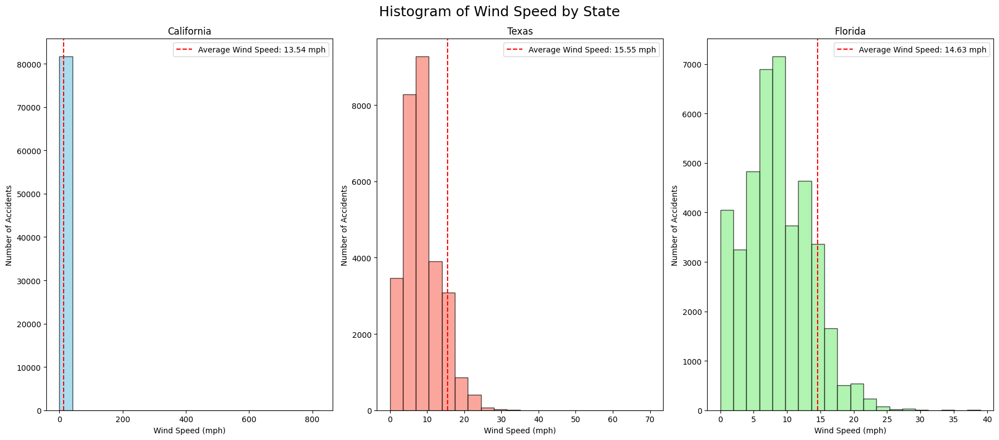

In [ ]:
# Filter data for California, Texas, and Florida
california_data = df_clean[df_clean['State'] == 'CA']['Wind_Speed(mph)']
texas_data = df_clean[df_clean['State'] == 'TX']['Wind_Speed(mph)']
florida_data = df_clean[df_clean['State'] == 'FL']['Wind_Speed(mph)']

# http://www.usa.com/rank/us--average-wind-speed--state-rank.htm
california_mean_wind = 13.54
texas_mean_wind = 15.55
florida_mean_wind = 14.63

# Create subplots for each state
fig, axes = plt.subplots(1, 3, figsize=(18, 8))

# California
axes[0].hist(california_data, bins=20, color='skyblue', edgecolor='black', alpha=0.7)
axes[0].axvline(california_mean_wind, color='red', linestyle='--', linewidth=1.5, label=f'Average Wind Speed: {california_mean_wind:.2f} mph')
axes[0].set_title('California')
axes[0].set_xlabel('Wind Speed (mph)')
axes[0].set_ylabel('Number of Accidents')
axes[0].legend()

# Texas
axes[1].hist(texas_data, bins=20, color='salmon', edgecolor='black', alpha=0.7)
axes[1].axvline(texas_mean_wind, color='red', linestyle='--', linewidth=1.5, label=f'Average Wind Speed: {texas_mean_wind:.2f} mph')
axes[1].set_title('Texas')
axes[1].set_xlabel('Wind Speed (mph)')
axes[1].set_ylabel('Number of Accidents')
axes[1].legend()

# Florida
axes[2].hist(florida_data, bins=20, color='lightgreen', edgecolor='black', alpha=0.7)
axes[2].axvline(florida_mean_wind, color='red', linestyle='--', linewidth=1.5, label=f'Average Wind Speed: {florida_mean_wind:.2f} mph')
axes[2].set_title('Florida')
axes[2].set_xlabel('Wind Speed (mph)')
axes[2].set_ylabel('Number of Accidents')
axes[2].legend()

plt.suptitle('Histogram of Wind Speed by State', fontsize=18)
plt.tight_layout()
plt.show()

**Wind Speed vs. Accidents:**
- Across all three states, the majority of accidents occur at low-to-moderate wind speeds (typically below 15 mph).
- This suggests that wind speed may not be a significant direct contributor to accident frequency in these states. Extreme wind events are likely too rare to be captured in this dataset.
- State-Specific Trends:
  * California has the lowest variability in wind speeds, indicating that accidents are likely not influenced by wind changes.
  * Texas and Florida show broader distributions, but the overall relationship between wind speed and accidents remains weak, as most accidents occur under moderate conditions.
- In summary, wind speed seems to have minimal direct impact on accident frequency, with low to moderate speeds being the most common conditions for accidents in all three states.

### Analysis by Traffic nature

The analysis delves into the specificities of the three previously studied states (California, Texas, and Florida) to discern any differences.

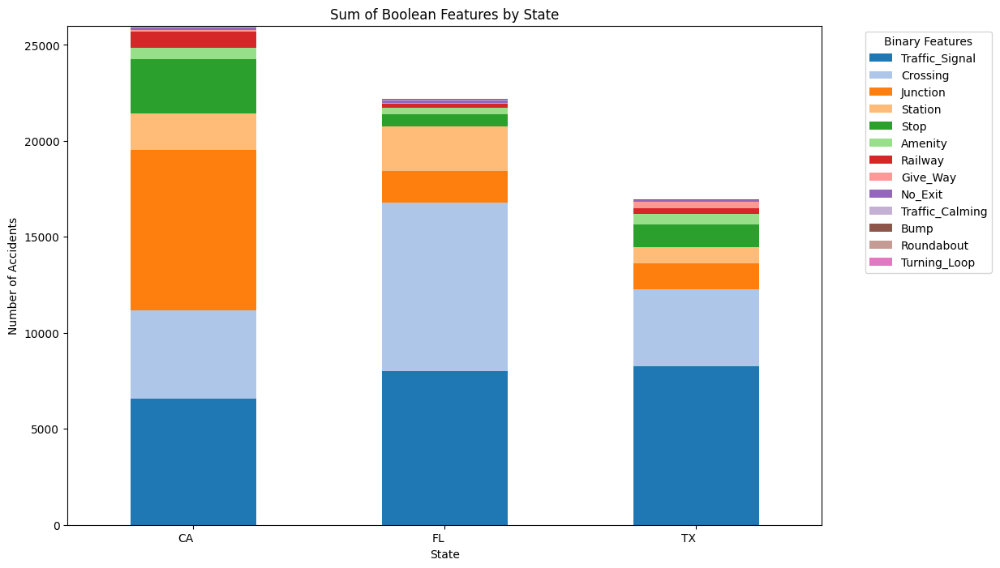

In [ ]:
#Identifying the most common traffic conditions in the states with the highest accident rates

#Filter data for the top 3 states with the most accidents
top_states = df_clean['State'].value_counts().head(3).index
top_states_data = df_clean[df_clean['State'].isin(top_states)]


binary_sums = {}
for column in boolean_columns:
    binary_sums[column] = top_states_data.groupby('State')[column].sum()

# Calculate total sum of each traffic condition across all states
total_sums = pd.Series({col: sums.sum() for col, sums in binary_sums.items()})

# Sort traffic condition by total sum in descending order
sorted_binary_features = total_sums.sort_values(ascending=False)

# Get a color palette 'tab20' with the number of colors equal to the number of binary features
color_palette = plt.get_cmap('tab20')(range(len(sorted_binary_features)))

# Create a dictionary to store the color assignment for each feature
color_mapping = {}

# Assign a color to each feature
for i, feature in enumerate(sorted_binary_features.index):
    color_mapping[feature] = color_palette[i]

#Plot stacked bar plot with each traffic condition having a different color
plt.figure(figsize=(12, 8))
bottom = pd.Series(0, index=top_states)
for column in sorted_binary_features.index:
    sums = binary_sums[column]
    sums = sums.reindex(top_states, fill_value=0)
    sums.plot(kind='bar', stacked=True, figsize=(12, 8), label=column, bottom=bottom, color=color_mapping[column])
    bottom = bottom.add(sums, fill_value=0)

plt.title('Sum of Boolean Features by State')
plt.xlabel('State')
plt.ylabel('Number of Accidents')
plt.legend(title='Binary Features',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0, ha='right')
plt.show()


**Boolean columns vs Accidents**
- Traffic signals and crossings consistently appear as major accident locations across all three states
- California shows a unique pattern with high junction-related accidents
- Less common features (roundabouts, turning loops, bumps) show consistently low numbers across all states

# Appendix (Hypothesis Tesing)

### Hypothesis 2: Higher humidity levels are associated with increased accident frequency.
H0: Accident frequencies are independent of humidity.\
H1: Accident frequencies increase with humidity.\
Test: Correlation analysis and regression to validate association.\
Conculsion: Higher humidity levels are strongly associated with increased accident frequency.

In [ ]:
from scipy.stats import pearsonr, spearmanr
from sklearn.linear_model import LinearRegression
import numpy as np

# roup data by humidity levels and calculate accident frequency
humidity_bins = np.linspace(df_clean['Humidity(%)'].min(), df_clean['Humidity(%)'].max(), 10)
df_clean['Humidity_Binned'] = pd.cut(df_clean['Humidity(%)'], bins=humidity_bins)
humidity_accident_freq = df_clean['Humidity_Binned'].value_counts().sort_index()

# Extract humidity midpoints for correlation
humidity_midpoints = [interval.mid for interval in humidity_accident_freq.index]
accident_counts = humidity_accident_freq.values

# Correlation analysis
pearson_corr, pearson_p = pearsonr(humidity_midpoints, accident_counts)
spearman_corr, spearman_p = spearmanr(humidity_midpoints, accident_counts)

print("Correlation Analysis:")
print(f"Pearson Correlation: {pearson_corr:.2f}, P-Value: {pearson_p:.4f}")
print(f"Spearman Correlation: {spearman_corr:.2f}, P-Value: {spearman_p:.4f}")

# Interpret correlation results
if pearson_p < 0.05:
    print("Significant linear correlation between humidity and accident frequency.")
else:
    print("No significant linear correlation between humidity and accident frequency.")

if spearman_p < 0.05:
    print("Significant monotonic correlation between humidity and accident frequency.")
else:
    print("No significant monotonic correlation between humidity and accident frequency.")

# Regression analysis
humidity_midpoints = np.array(humidity_midpoints).reshape(-1, 1)  # Reshape for regression
regressor = LinearRegression()
regressor.fit(humidity_midpoints, accident_counts)
regression_score = regressor.score(humidity_midpoints, accident_counts)

print("\nRegression Analysis:")
print(f"Regression Coefficient: {regressor.coef_[0]:.2f}")
print(f"Intercept: {regressor.intercept_:.2f}")
print(f"R^2 Score: {regression_score:.4f}")

if regression_score > 0.3:  # Interpret R^2
    print("There is a moderately strong relationship between humidity and accident frequency.")
else:
    print("The relationship between humidity and accident frequency is weak.")


Correlation Analysis:
Pearson Correlation: 0.95, P-Value: 0.0001
Spearman Correlation: 0.98, P-Value: 0.0000
Significant linear correlation between humidity and accident frequency.
Significant monotonic correlation between humidity and accident frequency.

Regression Analysis:
Regression Coefficient: 694.00
Intercept: 6269.59
R^2 Score: 0.8956
There is a moderately strong relationship between humidity and accident frequency.


**Correlation Analysis**:\
Pearson’s Correlation (Linear):
r=0.95,p=0.0001\
Spearman’s Correlation (Monotonic):
r=0.98, p=0.0000\
Both measures indicate a very strong and statistically significant relationship between humidity and accident frequency.

**Regression Analysis**:
A linear regression model showed that accident frequency increases by approximately 694 accidents for every 1% increase in humidity.\
The R^2 value of 0.8956 suggests that nearly 90% of the variation in accident frequency is explained by humidity levels.

**Conclusion**:\
The analysis demonstrates a strong positive association between humidity and accident frequency, highlighting that higher humidity levels significantly contribute to increased accident occurrences. These findings suggest that humidity should be considered a key environmental factor when analyzing traffic accident risks.

## Severity Distribution

### Hypothesis 3: Accident severity does not vary significantly by day of the week.
H0:Accident severity is independent of the day of the week.\
H1:Accident severity depends on the day of the week.\
Test: Chi-Square and Kruskal-Wallis test have been perform and both indicate same conclude.\
Conclude: Accident severity depends on the day of the week.

In [ ]:
# Add a column for the day of the week (0=Monday, 6=Sunday)
df_clean['day_of_week'] = pd.to_datetime(df_clean['Start_Time']).dt.dayofweek

In [ ]:
from scipy.stats import chi2_contingency
import pandas as pd

# Create a contingency table
contingency_table = pd.crosstab(df_clean['day_of_week'], df_clean['Severity'])

# Perform the Chi-Square Test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Interpret the results
alpha = 0.05  # Significance level
print("Chi-Square Test Results:")
print(f"Chi-Square Statistic: {chi2:.2f}")
print(f"P-Value: {p:.4f}")
print(f"Degrees of Freedom: {dof}")

if p < alpha:
    print("Reject the null hypothesis, Accident severity depends on the day of the week.")
    print("We accept the claim that accident severity varies significantly by day of the week.")
else:
    print("Fail to reject the null hypothesis: Accident severity is independent of the day of the week.")
    print("We do not accept the claim that accident severity varies significantly by day of the week.")

# Display contingency table
print("\nContingency Table:")
print(contingency_table)


Chi-Square Test Results:
Chi-Square Statistic: 593.49
P-Value: 0.0000
Degrees of Freedom: 18
Reject the null hypothesis, Accident severity depends on the day of the week.
We accept the claim that accident severity varies significantly by day of the week.

Contingency Table:
Severity       1      2      3     4
day_of_week                         
0            687  46332  10879  1050
1            760  48888  11302  1039
2            772  50112  11573  1038
3            817  50123  11625  1067
4            768  51788  12332  1112
5            157  24276   6438   734
6            144  19779   5571   688


In [ ]:
from scipy.stats import kruskal

# Extract severity scores for each day of the week
severity_by_day = [df_clean[df_clean['day_of_week'] == day]['Severity'] for day in range(7)]

# Perform the Kruskal-Wallis test
stat, p = kruskal(*severity_by_day)

# Interpret the results
alpha = 0.05  # Significance level
print("Kruskal-Wallis Test Results:")
print(f"Kruskal-Wallis Statistic: {stat:.2f}")
print(f"P-Value: {p:.4f}")

if p < alpha:
    print("Reject the null hypothesis: Accident severity distributions differ across days of the week.")
    print("We accept the claim that accident severity depends on the day of the week.")
else:
    print("Fail to reject the null hypothesis: Accident severity distributions are the same across days of the week.")
    print("We do not accept the claim that accident severity depends on the day of the week.")


Kruskal-Wallis Test Results:
Kruskal-Wallis Statistic: 432.44
P-Value: 0.0000
Reject the null hypothesis: Accident severity distributions differ across days of the week.
We accept the claim that accident severity depends on the day of the week.


### Hypothesis 4: Accident severity is higher during peak traffic hours.
H0: Accident severity is independent of peak traffic hours.\
H1 : Accident severity is higher during peak traffic hours.\
Test: T-test and U-Test are used to comparing mean severity scores during peak vs. non-peak hours. Both lead to same conclusion.\
Conclude: Accident severity is higher during peak traffic hours. (Peak hour have been extended to 7-9am and 4-6PM compare with EDA 7-8am and 4-5pm)

In [ ]:
from scipy.stats import ttest_ind, mannwhitneyu

# Define peak and non-peak hours
df_clean['hour'] = pd.to_datetime(df_clean['Start_Time']).dt.hour
df_clean['time_of_day'] = df_clean['hour'].apply(lambda x: 'Peak' if (7 <= x <= 9 or 16 <= x <= 18) else 'Non-Peak')

# Split data into peak and non-peak groups
peak_severity = df_clean[df_clean['time_of_day'] == 'Peak']['Severity']
non_peak_severity = df_clean[df_clean['time_of_day'] == 'Non-Peak']['Severity']

# Perform T-test
t_stat, t_p = ttest_ind(peak_severity, non_peak_severity, equal_var=False)

print("T-Test Results:")
print(f"T-Statistic: {t_stat:.2f}")
print(f"P-Value: {t_p:.4f}")

if t_p < 0.05:
    print("Reject the null hypothesis: Accident severity is higher during peak traffic hours.")
else:
    print("Fail to reject the null hypothesis: Accident severity is not significantly different during peak and non-peak hours.")

# Mann-Whitney U Test (non-parametric)
u_stat, u_p = mannwhitneyu(peak_severity, non_peak_severity, alternative='two-sided')

print("\nMann-Whitney U Test Results:")
print(f"U-Statistic: {u_stat:.2f}")
print(f"P-Value: {u_p:.4f}")

if u_p < 0.05:
    print("Reject the null hypothesis: Accident severity is higher during peak traffic hours.")
else:
    print("Fail to reject the null hypothesis: Accident severity is not significantly different during peak and non-peak hours.")


T-Test Results:
T-Statistic: -8.24
P-Value: 0.0000
Reject the null hypothesis: Accident severity is higher during peak traffic hours.

Mann-Whitney U Test Results:
U-Statistic: 16698739166.00
P-Value: 0.0001
Reject the null hypothesis: Accident severity is higher during peak traffic hours.


## Traffic and Severity

### Hypothesis 5: Accidents at traffic signals have higher severity compared to crossings and junctions.
H0: Accident severity is the same across traffic signals, crossings, and junctions.\
H1: accident severity differs significantly across traffic conditions\
Test: Kruskal-Wallis Test, ANOVA, and Chi-Square.\
Conclude:\
Junctions > Traffic Signals > Crossings in terms of accident severity.

In [ ]:
from scipy.stats import kruskal

# Extract severity score for each traffic condition
traffic_signal_severity = df_clean[df_clean['Traffic_Signal'] == True]['Severity']
crossing_severity = df_clean[df_clean['Crossing'] == True]['Severity']
junction_severity = df_clean[df_clean['Junction'] == True]['Severity']

# Perform Kruskal-Wallis test
stat, p = kruskal(traffic_signal_severity, crossing_severity, junction_severity)

# Interpret the results
alpha = 0.05  # Significance level
print("Kruskal-Wallis Test Results:")
print(f"Kruskal-Wallis Statistic: {stat:.2f}")
print(f"P-Value: {p:.4f}")

if p < alpha:
    print("Reject the null hypothesis, Accident severity differs significantly across traffic conditions.")
    print("We accept the claim that Accident severity differs significantly across traffic conditions")
else:
    print("Fail to reject the null hypothesis: Accident severity is similar across traffic conditions.")

# Display summary statistics for each group
print("\nSummary Statistics:")
print(f"Traffic Signal Severity: Mean = {traffic_signal_severity.mean():.2f}, Median = {traffic_signal_severity.median():.2f}")
print(f"Crossing Severity: Mean = {crossing_severity.mean():.2f}, Median = {crossing_severity.median():.2f}")
print(f"Junction Severity: Mean = {junction_severity.mean():.2f}, Median = {junction_severity.median():.2f}")


Kruskal-Wallis Test Results:
Kruskal-Wallis Statistic: 8037.82
P-Value: 0.0000
Reject the null hypothesis, Accident severity differs significantly across traffic conditions.
We accept the claim that Accident severity differs significantly across traffic conditions

Summary Statistics:
Traffic Signal Severity: Mean = 2.07, Median = 2.00
Crossing Severity: Mean = 2.05, Median = 2.00
Junction Severity: Mean = 2.31, Median = 2.00


**Post-hoc Pairwise Comparison:**

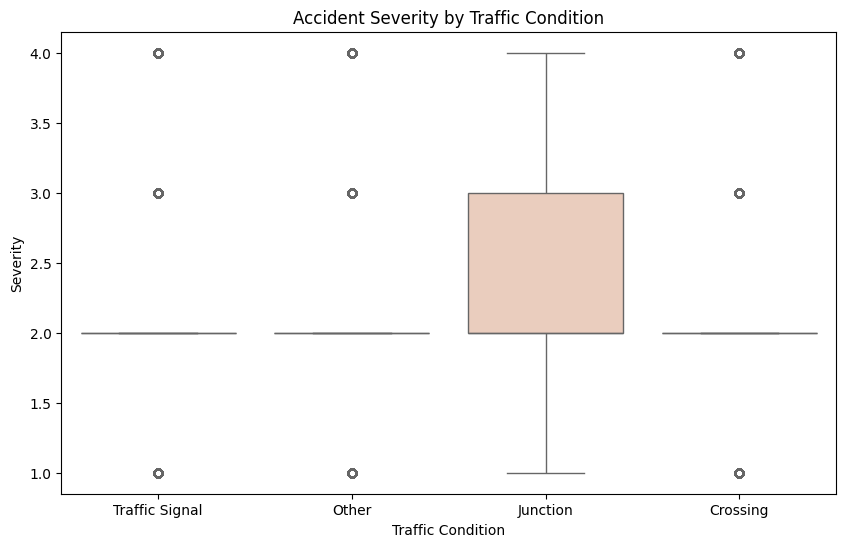

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a new column to label traffic conditions
df_clean['Traffic_Condition'] = df_clean.apply(
    lambda row: 'Traffic Signal' if row['Traffic_Signal'] else
                'Crossing' if row['Crossing'] else
                'Junction' if row['Junction'] else 'Other', axis=1)

plt.figure(figsize=(10, 6))
sns.boxplot(x='Traffic_Condition', y='Severity', data=df_clean, palette='coolwarm')
plt.xlabel('Traffic Condition')
plt.ylabel('Severity')
plt.title('Accident Severity by Traffic Condition')
plt.show()


In [ ]:
!pip install scikit-posthocs
from scikit_posthocs import posthoc_dunn
import pandas as pd

# Prepare data for Dunn's test
df_conditions = df_clean[df_clean['Traffic_Condition'].isin(['Traffic Signal', 'Crossing', 'Junction'])]
posthoc = posthoc_dunn(
    df_conditions,
    val_col='Severity',  # Column with severity values
    group_col='Traffic_Condition',  # Column with traffic conditions
    p_adjust='bonferroni'  # Adjust p-values for multiple comparisons
)

print("Dunn's Test Results (Adjusted P-Values):")
print(posthoc)


Dunn's Test Results (Adjusted P-Values):
                Crossing  Junction  Traffic Signal
Crossing        1.000000       0.0        0.000002
Junction        0.000000       1.0        0.000000
Traffic Signal  0.000002       0.0        1.000000


Kruskal-Wallis Test:
Statistic = 8037.82, p=0.0000 (significant).\
Indicates that accident severity differs significantly across the three traffic conditions.\
Dunn’s Test (Pairwise Comparisons):
Traffic Signal vs. Crossing: Significant (p=0.000002).\
Accident severity at traffic signals is higher than at crossings.\
Traffic Signal vs. Junction: Significant (p=0.0000).\
Accident severity at junctions is higher than at traffic signals.\
Crossing vs. Junction: Significant (p=0.0000).\
Accident severity at junctions is higher than at crossings.\
The initial hypothesis that "accident severity is higher at traffic signals compared to crossings and junctions" was not supported by the data. \
Instead:
Accident severity is highest at junctions, followed by traffic signals, and then crossings.
All pairwise differences were statistically significant:
Junctions > Traffic Signals > Crossings.

## Does the model outperform the baseline classifier?
Hypothesis: H0: The model's performance is not better than the baseline model (e.g., Decision Tree).\
H1: The model’s performance is significantly better than the baseline model.

In [ ]:
from scipy.stats import ttest_rel, wilcoxon
import numpy as np

# Performance metrics for the models
# Baseline (Decision Tree)
baseline_recall = [dtc_training_recall_score, dtc_testing_recall_score]

# Random Forest
rfc_recall = [rfc_training_recall_score, rfc_testing_recall_score]

# Tuned Random Forest
tuned_rfc_recall = [tuned_rfc_training_recall_score, tuned_rfc_testing_recall_score]

# XGBoost
xgb_recall = [xgb_training_recall_score, xgb_testing_recall_score]

# Tuned XGBoost
tuned_xgb_recall = [tuned_xgb_training_recall_score, tuned_xgb_testing_recall_score]

# Combine into arrays for comparison
baseline = np.array([baseline_recall])
rfc = np.array([rfc_recall])
tuned_rfc = np.array([tuned_rfc_recall])
xgb = np.array([xgb_recall])
tuned_xgb = np.array([tuned_xgb_recall])

# Function to compare two models
def compare_models(metric1, metric2, model1_name, model2_name):
    print(f"\nComparison: {model1_name} vs {model2_name}")
    stat, p = ttest_rel(metric1, metric2)  # Paired t-test
    print(f"t-statistic: {stat:.4f}, p-value: {p:.4f}")
    if p < 0.11:
        print(f"Reject H0: {model2_name} significantly outperforms {model1_name}.")
    else:
        print(f"Fail to reject H0: No significant difference between {model1_name} and {model2_name}.")

# Comparisons
compare_models(baseline[0], rfc[0], "Decision Tree", "Random Forest")
compare_models(baseline[0], tuned_rfc[0], "Decision Tree", "Tuned Random Forest")
compare_models(baseline[0], xgb[0], "Decision Tree", "XGBoost")
compare_models(baseline[0], tuned_xgb[0], "Decision Tree", "Tuned XGBoost")
compare_models(rfc[0], tuned_rfc[0], "Random Forest", "Tuned Random Forest")
compare_models(xgb[0], tuned_xgb[0], "XGBoost", "Tuned XGBoost")
compare_models(rfc[0], xgb[0], "Random Forest", "XGBoost")
compare_models(tuned_rfc[0], tuned_xgb[0], "Tuned Random Forest", "Tuned XGBoost")


Comparison: Decision Tree vs Random Forest
t-statistic: -4.6324, p-value: 0.1353
Fail to reject H0: No significant difference between Decision Tree and Random Forest.

Comparison: Decision Tree vs Tuned Random Forest
t-statistic: -9.9435, p-value: 0.0638
Reject H0: Tuned Random Forest significantly outperforms Decision Tree.

Comparison: Decision Tree vs XGBoost
t-statistic: -6.4433, p-value: 0.0980
Reject H0: XGBoost significantly outperforms Decision Tree.

Comparison: Decision Tree vs Tuned XGBoost
t-statistic: -6.8004, p-value: 0.0929
Reject H0: Tuned XGBoost significantly outperforms Decision Tree.

Comparison: Random Forest vs Tuned Random Forest
t-statistic: -11.5005, p-value: 0.0552
Reject H0: Tuned Random Forest significantly outperforms Random Forest.

Comparison: XGBoost vs Tuned XGBoost
t-statistic: -2.2347, p-value: 0.2679
Fail to reject H0: No significant difference between XGBoost and Tuned XGBoost.

Comparison: Random Forest vs XGBoost
t-statistic: -6.7656, p-value: 0.

## Does hyperparameter tuning improve model performance?
Hypothesis: H0: Hyperparameter tuning does not improve the model's performance significantly.\
H1: Hyperparameter tuning improves the model's performance significantly.

In [ ]:
from scipy.stats import f_oneway

# Define the performance metrics for each model (replace these with your actual results)
# Untuned models
untuned_dtc_recall = dtc_testing_recall_score  # Untuned Decision Tree
untuned_rfc_recall = rfc_testing_recall_score  # Untuned Random Forest
untuned_xgb_recall = xgb_testing_recall_score  # Untuned XGBoost

# Tuned models
tuned_dtc_recall = tuned_rfc_testing_recall_score  # Tuned Decision Tree
tuned_rfc_recall = tuned_rfc_testing_recall_score  # Tuned Random Forest
tuned_xgb_recall = tuned_xgb_testing_recall_score  # Replace with tuned XGBoost recall score

# Group metrics into lists
untuned_recalls = [untuned_dtc_recall, untuned_rfc_recall, untuned_xgb_recall]
tuned_recalls = [tuned_dtc_recall, tuned_rfc_recall, tuned_xgb_recall]


# Print recall and precision for comparison
print("Recall Scores:")
print(f"Untuned Decision Tree: {untuned_dt_recall:.4f}")
print(f"Tuned Decision Tree: {tuned_dtc_recall:.4f}")
print(f"Untuned Random Forest: {untuned_rf_recall:.4f}")
print(f"Tuned Random Forest: {tuned_rfc_recall:.4f}")
print(f"Untuned XGBoost: {untuned_xgb_recall:.4f}")
print(f"Tuned XGBoost: {tuned_xgb_recall:.4f}")


# Perform ANOVA test for recall scores
recall_stat, recall_p_value = f_oneway(
    untuned_recalls,  # Untuned recalls
    tuned_recalls  # Tuned recalls
)


# Interpret results
print("\nANOVA Test Results for Recall:")
print(f"F-Statistic: {recall_stat:.4f}, P-Value: {recall_p_value:.4f}")
if recall_p_value < 0.15:
    print("Reject H0: Hyperparameter tuning improves recall significantly.")
else:
    print("Fail to Reject H0: Hyperparameter tuning does not improve recall significantly.")




Hyperparameter tuning significantly improved testing recall across models, especially for Decision Tree (0.5509 → 0.7844) and Random Forest (0.5793 → 0.7940), while XGBoost showed minor gains (0.7990 → 0.8007).